## Import libraries

In [234]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import math
from collections import Counter
import folium

import xlrd

import json
import folium.plugins


import sklearn.preprocessing as sp
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from subprocess import check_output


from dython.nominal import identify_nominal_columns
import warnings
warnings.filterwarnings('ignore')

## Open file and initial exploration/ transformation


In [235]:
filename =r'../_Project2_/datasets/barcelona.csv'

In [236]:
df_1 = pd.read_csv(filename)
df_raw= df_1.copy()

In [237]:
print("There are ",len(df_1.columns), " columns in the original dataset.\n"" -We will drop those variables that are not needed for the analysis-")

There are  135  columns in the original dataset.
 -We will drop those variables that are not needed for the analysis-


In [238]:
pd.set_option('display.max_columns', 134)
pd.DataFrame(df_1.columns).T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,...,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134
0,ID,METODE,DATA,Codi_Districte,Nom_Districte,F0,F1,F2,RENDA,Q1,Q2,EDAT,ID4,ID4_PAIS,ID5,P9,ID7,ID8,ID9,P1,P1A,Q1A,P1B,P2_1,P2_2,P2_3,P2_4,P2_6,P2_7,P2_5,P2_5B,P2,P2A,P2B,P3_1,P3_2,P3_3,P3_0,P3_95,P3_98,P3_99,P4,P5A_1,P5A_2,P5A_3,P5A_4,P5A_5,P5A_6,P5A_7,P5A_8,P5A_9,P5A_10,P5A_11,P5A_12,P5A_13,P5A_14,P5A_15,P5A_16,P5A_17,P5A_18,P5A_19,P5A_20,P5A_18_cod,P6,P7,Q8,P8B,...,P10,P10B_1,P10B_2,P10B_3,P10B_4,P10B_5,P10B_6,P10B_95,P10B_98,P10B_99,P11_0,P11_1,P11_2,P11_3,P11_4,P11_5,P11_98,P11_99,P11B,P11C_1,P11C_2,P11C_3,P11C_4,P11C_5,P11C_6,P11C_95,P11C_98,P11C_99,P12,Q12,P13,P13B_1,P13B_2,P13B_3,P13B_4,P13B_5,P13B_98,P13B_99,ID10,ID11,P14,P14_1cod,P14_2cod,P5A_1rec,P5A_2rec,P5A_3rec,P5A_4rec,P5A_5rec,P5A_6rec,P5A_7rec,P5A_8rec,P5A_9rec,P5A_10rec,P5A_11rec,P5A_12rec,P5A_13rec,P5A_14rec,P5A_15rec,P5A_16rec,P5A_17rec,P5A_18rec,P5A_19rec,P5A_20rec,P2_LLAR,Longitud,Latitud,Pes


### Group answers about email
 `The especifications about the variable names, as well as their values, were extracted from the same 
 [website](https://opendata-ajuntament.barcelona.cat/data/es/dataset/enquesta-escletxa-digital)
 that contained the original dataset.
 

In [239]:
df_1

,ID,METODE,DATA,Codi_Districte,Nom_Districte,F0,F1,F2,RENDA,Q1,Q2,EDAT,ID4,ID4_PAIS,ID5,P9,ID7,ID8,ID9,P1,P1A,Q1A,P1B,P2_1,P2_2,P2_3,P2_4,P2_6,P2_7,P2_5,P2_5B,P2,P2A,P2B,P3_1,P3_2,P3_3,P3_0,P3_95,P3_98,P3_99,P4,P5A_1,P5A_2,P5A_3,P5A_4,P5A_5,P5A_6,P5A_7,P5A_8,P5A_9,P5A_10,P5A_11,P5A_12,P5A_13,P5A_14,P5A_15,P5A_16,P5A_17,P5A_18,P5A_19,P5A_20,P5A_18_cod,P6,P7,Q8,P8B,...,P10,P10B_1,P10B_2,P10B_3,P10B_4,P10B_5,P10B_6,P10B_95,P10B_98,P10B_99,P11_0,P11_1,P11_2,P11_3,P11_4,P11_5,P11_98,P11_99,P11B,P11C_1,P11C_2,P11C_3,P11C_4,P11C_5,P11C_6,P11C_95,P11C_98,P11C_99,P12,Q12,P13,P13B_1,P13B_2,P13B_3,P13B_4,P13B_5,P13B_98,P13B_99,ID10,ID11,P14,P14_1cod,P14_2cod,P5A_1rec,P5A_2rec,P5A_3rec,P5A_4rec,P5A_5rec,P5A_6rec,P5A_7rec,P5A_8rec,P5A_9rec,P5A_10rec,P5A_11rec,P5A_12rec,P5A_13rec,P5A_14rec,P5A_15rec,P5A_16rec,P5A_17rec,P5A_18rec,P5A_19rec,P5A_20rec,P2_LLAR,Longitud,Latitud,Pes
0,5,1,20201015,2,Eixample,3,1,1,3,1,64,5,1,NaN,2,NaN,4,3,0,1,2.0,4.0,NaN,3,2,1,2,0,0,0,NaN,1,2.0,95.0,NaN,NaN,NaN,NaN,NaN,NaN,99.0,1,1.0,1.0,5.0,2.0,4.0,5.0,1.0,5.0,3.0,5.0,3.0,5.0,5.0,5.0,4.0,4.0,5.0,4.0,2.0,1.0,1.0,2.0,6,4.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,7.0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,2,NaN,NaN,NaN,1.0,1.0,2.0,1.0,1.0,2.0,1.0,2.0,1.0,2.0,1.0,2.0,2.0,2.0,1.0,1.0,2.0,1.0,1.0,1.0,8.0,2.156566,41.382082,0.741578
1,6,1,20201015,5,Sarrià - Sant Gervasi,3,1,1,5,2,58,5,1,NaN,1,1.0,4,5,0,1,2.0,98.0,NaN,7,4,5,1,0,1,0,NaN,1,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,99.0,1,1.0,1.0,4.0,1.0,2.0,5.0,1.0,1.0,1.0,4.0,1.0,5.0,4.0,5.0,1.0,2.0,5.0,5.0,2.0,1.0,NaN,2.0,0,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,0.0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,2,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,2.0,1.0,1.0,2.0,2.0,1.0,1.0,17.0,2.140351,41.405319,0.572459
2,9,1,20201015,7,Horta - Guinardó,3,1,1,2,2,60,5,1,NaN,1,99.0,3,2,0,1,2.0,5.0,NaN,2,2,0,0,0,0,0,NaN,1,2.0,98.0,NaN,NaN,NaN,NaN,NaN,NaN,99.0,1,2.0,1.0,2.0,5.0,5.0,5.0,1.0,4.0,3.0,2.0,2.0,4.0,3.0,4.0,1.0,4.0,5.0,5.0,2.0,2.0,NaN,1.0,0,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,10.0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,2,NaN,NaN,NaN,1.0,1.0,1.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,1.0,4.0,2.153140,41.425456,1.740063
3,12,1,20201015,2,Eixample,1,1,1,3,2,78,7,1,NaN,3,NaN,1,1,0,1,2.0,5.0,NaN,2,1,0,0,0,0,0,NaN,1,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,99.0,1,2.0,1.0,4.0,5.0,5.0,5.0,2.0,3.0,5.0,5.0,1.0,5.0,5.0,5.0,4.0,5.0,5.0,5.0,5.0,5.0,NaN,2.0,0,NaN,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,8.0,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,2,NaN,NaN,NaN,1.0,1.0,1.0,2.0,2.0,2.0,1.0,1.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,3.0,2.177373,41.406421,0.918977
4,13,1,20201015,1,Ciutat Vella,2,1,1,3,1,47,4,3,528.0,1,1.0,4,3,1,1,2.0,4.0,NaN,3,1,3,0,2,0,0,NaN,1,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,99.0,1,1.0,1.0,1.0,1.0,5.0,1.0,1.0,3.0,1.0,3.0,2.0,4.0,3.0,5.0,4.0,5.0,5.0,5.0,5.0,1.0,NaN,2.0,0,NaN,1.0,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,2,NaN,NaN,NaN,1.0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,2.0,2.0,2.0,2.0,1.0,7.0,2.172285,41.384083,0.923780
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

In [240]:
# create a list of our conditions
conditions = [(df_1['P3_1'] ==1 )|(df_1['P3_2'] ==1 ),(df_1['P3_0'] ==1 ),(df_1['P3_98']==98)|(df_1['P3_99'] ==99 )]

# create a list of the values we want to assign for each condition
values = [1, 0,99]

# create a new column and use np.select to assign values to it using our lists as arguments
df_1['Has_email'] = np.select(conditions, values)
df_1.drop(columns=["P3_1","P3_2","P3_0","P3_98","P3_99"],inplace=True)

In [241]:
df_1['Has_email'].isnull().sum()

0

In [242]:
#print("There are ",len(df_1.columns), " columns")
#for column in df_1:
   # print("The values from the variable: ",df_1[column].name,"are: ",df_1[column].unique())  

### Select only relevant variables

In [243]:
df_2 = df_1[["Codi_Districte","Nom_Districte","RENDA","Q1","EDAT","ID4","ID4_PAIS","ID10","ID5","P1","P1B","Has_email","P9","P5A_1rec","P5A_2rec","P5A_3rec","P5A_4rec","P5A_5rec","P5A_7rec","P5A_8rec","P5A_9rec","P5A_10rec","P5A_11rec","P5A_12rec","P5A_15rec","P5A_16rec","Longitud","Latitud","Pes"]].copy()

In [244]:
pd.DataFrame(df_2.columns).T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28
0,Codi_Districte,Nom_Districte,RENDA,Q1,EDAT,ID4,ID4_PAIS,ID10,ID5,P1,P1B,Has_email,P9,P5A_1rec,P5A_2rec,P5A_3rec,P5A_4rec,P5A_5rec,P5A_7rec,P5A_8rec,P5A_9rec,P5A_10rec,P5A_11rec,P5A_12rec,P5A_15rec,P5A_16rec,Longitud,Latitud,Pes


### Change variables' names

In [245]:

dict = {'Codi_Districte':'District_code','Nom_Districte':'District_name','P1':'Has_internet','P1B':'Reasons_no_internet','RENDA':'income_code','Q1':'Sex','EDAT':'Age','ID4': 'Nacionality','ID4_PAIS': 'Country_origin','ID5': 'Occupation','ID10': 'Education_level','P4': 'Internet_use','P3': 'Has_Email',"P5A_16rec":"Online_administration","P5A_15rec":"Online_doctor","P5A_12rec":"Online_education","P5A_11rec":"Online_banking","P5A_10rec":"Online_shoping","P5A_9rec":"Google_health","P5A_8rec":"Google_administrative","P5A_7rec":"Online_news","P5A_5rec":"Publish_online","P5A_4rec":"social_network","P5A_3rec":"videocall","P5A_2rec":"WhatsApp","P5A_1rec":"use_email", "P9":"WFH","ID5":"Occupation"}
df_2.rename(columns=dict,inplace=True)

In [246]:
pd.DataFrame(df_2.columns).T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28
0,District_code,District_name,income_code,Sex,Age,Nacionality,Country_origin,Education_level,Occupation,Has_internet,Reasons_no_internet,Has_email,WFH,use_email,WhatsApp,videocall,social_network,Publish_online,Online_news,Google_administrative,Google_health,Online_shoping,Online_banking,Online_education,Online_doctor,Online_administration,Longitud,Latitud,Pes


### Fill nan with value (for those cases answer the variable is conditional from another)

In [247]:
df_2.loc[df_2['Reasons_no_internet'].isnull() & df_2['Has_internet'].eq(1), 'Reasons_no_internet'] = 98

In [248]:
df_2.loc[df_2['Country_origin'].isnull() & df_2['Nacionality'].eq(1), 'Country_origin'] = 98

In [249]:
df_2.loc[df_2['Country_origin'].isnull() & df_2['Nacionality'].eq(2),  'Country_origin'] = 98

In [250]:
df_2 =df_2.replace(np.nan, 99) #fill rest nan

### Create new nominal variables 

In [251]:
# create a list of our conditions for variables 

conditions_income = [(df_2['income_code'] ==1 ),(df_2['income_code'] ==2 ),(df_2['income_code']==3),(df_2['income_code'] ==4),(df_2['income_code'] ==5)]
conditions_sex = [(df_2['Sex'] ==1 ),(df_2['Sex'] ==2),(df_2['Sex'] ==3 )]
conditions_age =[(df_2['Age'] ==1 ),(df_2['Age'] ==2),(df_2['Age'] ==3 ),(df_2['Age'] ==4 ),(df_2['Age'] ==5 ),(df_2['Age'] ==6 ),(df_2['Age'] ==7 )]
conditions_nacionality = [(df_2['Nacionality'] ==1 ),(df_2['Nacionality'] ==2),(df_2['Nacionality'] ==3 )] 


conditions_country= [(df_2['Country_origin'] ==4.0),(df_2['Country_origin'] ==8.0),(df_2['Country_origin'] ==12.0),
 (df_2['Country_origin'] ==16.0), (df_2['Country_origin'] ==20.0), (df_2['Country_origin'] ==24.0),
(df_2['Country_origin'] ==28.0),(df_2['Country_origin'] ==31.0),(df_2['Country_origin'] ==32.0),
 (df_2['Country_origin'] ==36.0),(df_2['Country_origin'] ==40.0),(df_2['Country_origin'] ==44.0),
 (df_2['Country_origin'] ==48.0),(df_2['Country_origin'] ==50.0),(df_2['Country_origin'] ==51.0),(df_2['Country_origin'] ==52.0),
 (df_2['Country_origin'] ==56.0), (df_2['Country_origin'] ==60.0), (df_2['Country_origin'] ==64.0),
(df_2['Country_origin'] ==68.0),(df_2['Country_origin'] ==70.0),(df_2['Country_origin'] ==72.0),
 (df_2['Country_origin'] ==76.0),(df_2['Country_origin'] ==84.0),(df_2['Country_origin'] ==90.0),(df_2['Country_origin'] ==92.0),(df_2['Country_origin'] ==96.0),
 (df_2['Country_origin'] ==100.0),(df_2['Country_origin'] ==104.0),(df_2['Country_origin'] ==108.0),(df_2['Country_origin'] ==98)]


conditions_education = [(df_2["Education_level"]==1),(df_2["Education_level"]==2),(df_2["Education_level"]==3),(df_2["Education_level"]==4),(df_2["Education_level"]==5),(df_2["Education_level"]==98),(df_2["Education_level"]==99)]
conditions_occu = [(df_2['Occupation'] ==1 ),(df_2['Occupation'] ==2 ),(df_2['Occupation'] ==3 ),(df_2['Occupation'] ==4 ),(df_2['Occupation'] ==5 ),(df_2['Occupation'] ==99 )]
conditions_wfh = [(df_2['WFH'] ==1 ),(df_2['WFH'] ==2 ),(df_2['WFH'] ==3 ),(df_2['WFH'] ==4 ),(df_2['WFH'] ==5 ),(df_2['WFH'] ==98 ),(df_2['WFH'] ==99 )]
#conditions_nacionality = [(df_2['Nacionality'] ==1 ),(df_2['Nacionality'] ==2),(df_2['Nacionality'] ==3 )]                                    
conditions_internet= [(df_2['Has_internet'] ==1 ),(df_2['Has_internet'] ==2),(df_2['Has_internet'] ==98 ),(df_2['Has_internet'] ==99 )] 
conditions_Reasons_no_internet= [(df_2['Reasons_no_internet'] ==1 ),(df_2['Reasons_no_internet'] ==2),(df_2['Reasons_no_internet'] ==3),(df_2['Reasons_no_internet'] ==4 ),(df_2['Reasons_no_internet'] ==51 ),(df_2['Reasons_no_internet'] ==52 ),(df_2['Reasons_no_internet'] ==6 ),(df_2['Reasons_no_internet'] ==7 ),(df_2['Reasons_no_internet'] ==95 ),(df_2['Reasons_no_internet'] ==98 ),(df_2['Reasons_no_internet'] ==99 )] 


# create a list of the values we want to assign for each condition
values_sex = ["Men", "Women", "Non_binary"]
values_age = ["16-24", "25-34", "35-44","45-54","55-64", "65-74", "75+"]
values_income = ["Low","Low_middle","Middle","Middle_high","High"]
values_nationality = ["Spanish", "Spanish_others", "Foreigner"]

values_country = ["Afganistan","Albania","Algeria","Samoa Nord-americana","Andorra","Angola","Antigua i Barbuda","Azerbaidjan","Argentina","Australia","Austria",
  "Bahames","Bahrain", "Bangladesh", "Armenia","Barbados","Bèlgica","Illes Bermudes","Bhutan","Bolivia","Bosnia i Hercegovina",
"Botswana","Brazil","Belize","Salomon islands","Illes Verges Britaniques","Brunei","Bulgaria","Myanmar", "Burundi","Spain"]

values_education =["Unfinished studies","Primary/ESO","Batxillerat/Preu/BUP/COU","FP1/FP","Diplomatura/Llicenciatura","DK/DA","DK/DA"]
values_occu = ["Employed","Unemployed","Retired/Pensionist","Informal work","Student","DK/DA"]
values_wfh = ["Yes","Yes","Yes","Yes","No, my work can't wfh","DK/DA","DK/DA"]
values_internet =["Yes", "No","DK/DA","DK/DA"]
values_Reasons_no_internet =["Outside area", "Can\'t afford it","No devices","I use the smartphone","I don\'t use internet","Don\'t know how to use it","Use public wifi","Use outside private wifi", "Other","DK/DA","DK/DA"]



# create a new columns  and use np.select to assign values to it using our lists as arguments
df_2['Sex_c'] = np.select(conditions_sex, values_sex)
df_2['Age_c'] = np.select(conditions_age, values_age)
df_2['Nacionality_c'] = np.select(conditions_nacionality, values_nationality)
df_2['country_c']=np.select(conditions_country, values_country)
df_2['Household_income_c'] = np.select(conditions_income, values_income)
df_2['Education_level_c'] = np.select(conditions_education, values_education)
df_2['Occupation_c'] = np.select(conditions_occu, values_occu)
df_2['Work_from_home_c'] = np.select(conditions_wfh, values_wfh)
df_2["Has_internet_c"] =np.select(conditions_internet, values_internet)
df_2["Reasons_no_internet_cat"] =np.select(conditions_Reasons_no_internet, values_Reasons_no_internet)

df_2.head(1) #check everything looks right

,District_code,District_name,income_code,Sex,Age,Nacionality,Country_origin,Education_level,Occupation,Has_internet,Reasons_no_internet,Has_email,WFH,use_email,WhatsApp,videocall,social_network,Publish_online,Online_news,Google_administrative,Google_health,Online_shoping,Online_banking,Online_education,Online_doctor,Online_administration,Longitud,Latitud,Pes,Sex_c,Age_c,Nacionality_c,country_c,Household_income_c,Education_level_c,Occupation_c,Work_from_home_c,Has_internet_c,Reasons_no_internet_cat
0,2,Eixample,3,1,5,1,98.0,3,2,1,98.0,99,99.0,1.0,1.0,2.0,1.0,1.0,1.0,2.0,1.0,2.0,1.0,2.0,1.0,1.0,2.156566,41.382082,0.741578,Men,55-64,Spanish,Spain,Middle,Batxillerat/Preu/BUP/COU,Unemployed,DK/DA,Yes,DK/DA


In [252]:
df_2.Sex_c.value_counts() #We drop binary from the analysis as 2 persons are not enough to fraw any conclusions

Women         1375
Men           1165
Non_binary       2
Name: Sex_c, dtype: int64

In [253]:
df_2.drop(df_2.loc[df_2['Sex_c']=="Non_binary"].index, inplace=True)


In [254]:
df_2.Sex_c.value_counts()  #check everything looks right

Women    1375
Men      1165
Name: Sex_c, dtype: int64

## Convert to categorical variables that count as digital skills

The indicators for digital skills were taken from the [ESMS Indicator Profile (ESMS-IP)](https://ec.europa.eu/eurostat/cache/metadata/en/tepsr_sp410_esmsip2.htm)

In [255]:
# create a list of our conditions for variables 

conditions_admi = [(df_2['Online_administration'] ==1 ),(df_2['Online_administration'] ==2 ),(df_2['Online_administration'] ==98 ),(df_2['Online_administration'] ==99 )]
conditions_doctor = [(df_2['Online_doctor'] ==1 ),(df_2['Online_doctor'] ==2 ),(df_2['Online_doctor'] ==98 ),(df_2['Online_doctor'] ==99 )]
conditions_ed =[(df_2['Online_education'] ==1 ),(df_2['Online_education'] ==2 ),(df_2['Online_education'] ==98 ),(df_2['Online_education'] ==99 )]
conditions_bank = [(df_2['Online_banking'] ==1 ),(df_2['Online_banking'] ==2 ),(df_2['Online_banking'] ==98 ),(df_2['Online_banking'] ==99 )]
conditions_usemail = [(df_2['use_email'] ==1 ),(df_2['use_email'] ==2 ),(df_2['use_email'] ==98 ),(df_2['use_email'] ==99 )]
conditions_whats = [(df_2['WhatsApp'] ==1 ),(df_2['WhatsApp'] ==2 ),(df_2['WhatsApp'] ==98 ),(df_2['WhatsApp'] ==99 )]
conditions_videocall = [(df_2['videocall'] ==1 ),(df_2['videocall'] ==2 ),(df_2['videocall'] ==98 ),(df_2['videocall'] ==99 )]
conditions_social_network = [(df_2['social_network'] ==1 ),(df_2['social_network'] ==2 ),(df_2['social_network'] ==98 ),(df_2['social_network'] ==99 )]
conditions_Publish_online = [(df_2['Publish_online'] ==1 ),(df_2['Publish_online'] ==2 ),(df_2['Publish_online'] ==98 ),(df_2['Publish_online'] ==99 )]
conditions_Online_news = [(df_2['Online_news'] ==1 ),(df_2['Online_news'] ==2 ),(df_2['Online_news'] ==98 ),(df_2['Online_news'] ==99 )]
conditions_Google_administrative = [(df_2['Google_administrative'] ==1 ),(df_2['Google_administrative'] ==2 ),(df_2['Google_administrative'] ==98 ),(df_2['Google_administrative'] ==99 )]
conditions_Google_health = [(df_2['Google_health'] ==1 ),(df_2['Google_health'] ==2 ),(df_2['Google_health'] ==98 ),(df_2['Google_health'] ==99 )]
conditions_Online_shoping = [(df_2['Online_shoping'] ==1 ),(df_2['Online_shoping'] ==2 ),(df_2['Online_shoping'] ==98 ),(df_2['Online_shoping'] ==99 )]
                                    
# create a list of the values we want to assign for each condition

values = ["Yes","No","DK/DA","DK/DA"]

# create a new columns  and use np.select to assign values to it using our lists as arguments

#INFORMATION SKILLS

df_2['Online_administration_c'] = np.select(conditions_admi, values)
df_2['Google_administrative_c'] = np.select(conditions_Google_administrative, values)
df_2['Online_doctor_c'] = np.select(conditions_doctor, values)
df_2['Google_health_c'] = np.select(conditions_Google_health, values)
df_2['Online_news_c'] = np.select(conditions_Online_news, values)



#COMUNICATION SKILLS

df_2['Use_email_c'] = np.select(conditions_usemail, values)
df_2['WhatsApp_c'] = np.select(conditions_whats, values)
df_2['Videocall_c'] = np.select(conditions_videocall, values)
df_2['Publish_online_c'] = np.select(conditions_Publish_online, values)



#PROBLEM SOLVING SKILLS
df_2['Online_education_c'] = np.select(conditions_ed, values)
df_2['Online_banking_c'] = np.select(conditions_bank, values)
df_2['Online_shoping_c'] = np.select(conditions_Online_shoping, values)

In [256]:
for column in df_2:
    print("The values from the variable: ",df_2[column].name,"are: ",df_2[column].unique())  

The values from the variable:  District_code are:  [ 2  5  7  1  8  9  6  4 10  3]
The values from the variable:  District_name are:  ['Eixample' 'Sarrià - Sant Gervasi' 'Horta - Guinardó' 'Ciutat Vella'
 'Nou Barris' 'Sant Andreu' 'Gràcia' 'Les Corts' 'Sant Martí'
 'Sants - Montjuïc']
The values from the variable:  income_code are:  [3 5 2 1 4]
The values from the variable:  Sex are:  [1 2]
The values from the variable:  Age are:  [5 7 4 6 2 3 1]
The values from the variable:  Nacionality are:  [1 3 2]
The values from the variable:  Country_origin are:  [ 98. 528.  68.  40. 340. 380. 752. 840. 276.  51.  76. 608. 792. 170.
 250. 604. 643.  50. 620. 894. 484. 218. 203. 356. 212. 586. 826.  32.
 862. 214. 504. 642. 222. 156. 158.  56. 288. 152.  12. 600. 428. 372.
 100. 804. 192. 246. 760. 616. 440.  20. 756.   8. 268. 408. 392. 300.
 688. 410. 191. 466. 818. 124. 558. 400. 226. 270.]
The values from the variable:  Education_level are:  [ 3  5  4  2  1 99]
The values from the variable: 

### Create variables to count each of digital skills types (Information, Communication and Problem solving skills 

In [257]:
df_2["Information_skills"] = df_2.loc[:,["Online_news_c","Online_administration_c","Google_administrative_c","Google_health_c","Online_doctor_c"]].eq("Yes").sum(axis=1)
df_2["Communication_skills"] = df_2.loc[:,["Use_email_c","WhatsApp_c","Videocall_c","Publish_online_c"]].eq("Yes").sum(axis=1)
df_2["Problem_solving_skills"] = df_2.loc[:,["Online_shoping_c","Online_banking_c","Online_education_c"]].eq("Yes").sum(axis=1)
#df_2.head(1)


In [258]:
# create a list of our conditions for variables 

conditions_info = [(df_2['Information_skills'] ==1 ),(df_2['Information_skills'] >1 ),(df_2['Information_skills'] ==0 )]
conditions_com = [(df_2['Communication_skills'] ==1 ),(df_2['Communication_skills'] >1 ),(df_2['Communication_skills'] ==0 )]
conditions_prob = [(df_2['Problem_solving_skills'] ==1 ),(df_2['Problem_solving_skills'] >=2 ),(df_2['Problem_solving_skills'] ==0 )]

# create a list of the values we want to assign for each condition

values = ["Basic", "Above basic","No skills"]

# create a new columns  and use np.select to assign values to it using our lists as arguments

df_2['Information_skills_c'] = np.select(conditions_info, values)
df_2['Communication_skills_c'] = np.select(conditions_com, values)
df_2['Problem_solving_c'] = np.select(conditions_prob, values)

In [259]:
#df_2.head(1)

In [260]:
info =pd.DataFrame(df_2.Information_skills_c.value_counts()).T


In [261]:
communication = pd.DataFrame(df_2.Communication_skills_c.value_counts()).T


In [262]:
problem = pd.DataFrame(df_2.Problem_solving_c.value_counts()).T


In [263]:
All_skills = pd.concat([info, communication, problem])


In [264]:
def conditions2(df_2):
    if (df_2['Information_skills_c'] =="No skills" )&(df_2['Communication_skills_c'] =="No skills" )&(df_2['Problem_solving_c']=="No skills"):
        return "No digital skills" 

    else:
        return "Has skills"
    

df_2['Indice_general'] = df_2.apply(conditions2, axis=1)
#df_2.head(15)

In [265]:
conditions_barri = [(df_2['District_name'] =="Sant Martí" ),(df_2['District_name'] =="Les Corts" ),(df_2['District_name'] =="Gràcia" ),(df_2['District_name'] =="Sant Andreu" ),(df_2['District_name'] =="Nou Barris" ),(df_2['District_name'] =="Ciutat Vella" ),(df_2['District_name'] =="Eixample" ),(df_2['District_name'] =="Horta - Guinardó" ),(df_2['District_name'] =="Sants - Montjuïc" ),(df_2['District_name'] =="Sarrià - Sant Gervasi"  )]


# create a list of the values we want to assign for each condition

values = ["Sant Martí","Les Corts","Gràcia","Sant Andreu","Nou Barris","Ciutat Vella","Eixample","Horta-Guinardó", "Sants-Montjuïc","Sarrià-Sant Gervasi"]

# create a new columns  and use np.select to assign values to it using our lists as arguments

df_2['District_name'] = np.select(conditions_barri, values)
#df_2.District_name.unique()

## Create "Overall digital skills" indicator
 This also based on the [ESMS Indicator Profile (ESMS-IP)](https://ec.europa.eu/eurostat/cache/metadata/en/tepsr_sp410_esmsip2.htm). However, our survey doesn't contain all indicators needed, for example for software skills. Our **Overall digital skills** therefore has been adapted to fit out data. 

In [266]:
def conditions(df_2):
    if (df_2['Information_skills_c'] =="Above basic" )|(df_2['Communication_skills_c'] =="Above basic" )|(df_2['Problem_solving_c']=="Above basic"):
        return "Above basic"  
    
df_2['Indice_general'] = df_2.apply(conditions, axis=1)
#df_2.head(15)

In [267]:
df_2['Indice'] =(df_2['Information_skills_c'] =="No skills" ).astype(int)+(df_2['Communication_skills_c'] =="No skills" ).astype(int)+(df_2['Problem_solving_c']=="No skills").astype(int)

#df_2.head(15)

In [268]:
def final(df_2):
    if df_2.Indice ==3:
        return "No skills"
    elif (df_2.Indice >0) |(df_2.Indice <3) &(df_2["Indice_general"]!="Above basic"):
        return "Low skills"
    

In [269]:
def final(df_2):
    if df_2.Indice ==3:
        return "No skills"
    elif (df_2.Indice >0) |(df_2.Indice <3) &(df_2["Indice_general"]!="Above basic"):
        return "Low skills"
    if  (df_2.Indice ==0) &(df_2.Information_skills_c =="Above basic") &(df_2.Communication_skills_c =="Above basic")&(df_2.Problem_solving_c =="Above basic"):
        return "Above Basic"
    else:
        return "Basic skills"
    
df_2["Overall_digital_skills"] = df_2.apply(final, axis=1)

### Create simplified index that groups having skills (Basic +Above Basic) vs not having skills (Low skills + No skills)

In [270]:
# create a list of our conditions for variables 

conditions_ods = [(df_2['Overall_digital_skills'] =="Basic skills" ),(df_2['Overall_digital_skills']=="Above Basic" ),(df_2['Overall_digital_skills']=="Low skills" ),(df_2['Overall_digital_skills']=="No skills" )]

# create a list of the values we want to assign for each condition

values = ["Basic or above", "Basic or above","Low or no skills","Low or no skills"]

# create a new columns  and use np.select to assign values to it using our lists as arguments

df_2['ODS_ml'] = np.select(conditions_ods, values)


#df_2.head(5)

### Create index counting the opposite: "Has low skills" vs "Doesn't have low skills"

In [271]:
# create a list of our conditions for variables 

conditions_ods = [(df_2['Overall_digital_skills'] =="Basic skills" ),(df_2['Overall_digital_skills']=="Above Basic" ),(df_2['Overall_digital_skills']=="Low skills" ),(df_2['Overall_digital_skills']=="No skills" )]

# create a list of the values we want to assign for each condition

values = ["Doesn't have low", "Doesn't have low","Has Low or no skills","Has Low or no skills"]

# create a new columns  and use np.select to assign values to it using our lists as arguments

df_2['ODS_low'] = np.select(conditions_ods, values)


df_2.ODS_low.value_counts()

Doesn't have low        2108
Has Low or no skills     432
Name: ODS_low, dtype: int64

In [276]:
df_3 = df_2[["District_name","Sex_c","Age_c","Nacionality_c","country_c","Household_income_c","Education_level_c","Occupation_c","Overall_digital_skills","ODS_ml"]]

In [277]:
df_4 = df_2[["District_name","Sex_c","Age_c","Household_income_c","Education_level_c","Occupation_c","ODS_ml"]]

In [278]:
df_5 = df_2[["Education_level_c","Sex_c","Age_c","Household_income_c","Occupation_c","ODS_ml"]]

# Chi-square see if variables are dependent or independent from each other

We looked at [This table](https://www.mathsisfun.com/data/chi-square-table.html) to know whether out variables were dependent or independent from each other. We check the results from our calculations and compare it to the table. 

Defining the Hypotheses

`H₀ (Null Hypothesis)`—  the 2 categorical variables to be compared are independent of each other.

`H₁ (Alternate Hypothesis` —  the 2 categorical variables being compared are dependent on each other.

Draw your conclusions based on the following p-value conditions:

`p < 0.0` — this means the two categorical variables are correlated.

`p > 0.0` — this means the two categorical variables are not correlated.


#### Contingency tables for analysis

In [279]:
table_age = pd.crosstab(df_3['Age_c'], df_3['ODS_ml'])
table_occupation = pd.crosstab(df_3['Occupation_c'], df_3['ODS_ml'])
table_education = pd.crosstab(df_3['Education_level_c'], df_3['ODS_ml'])
table_income = pd.crosstab(df_3['Household_income_c'], df_3['ODS_ml'])
table_nacionality = pd.crosstab(df_2['Nacionality_c'], df_3['ODS_ml'])
table_country = pd.crosstab(df_2['country_c'], df_3['ODS_ml'])
table_district = pd.crosstab(df_4['District_name'], df_4['ODS_ml'])
table_problem = pd.crosstab(df_2['Problem_solving_c'], df_2['ODS_ml'])


table_sex = pd.crosstab(df_3['Sex_c'], df_3['ODS_ml'])





In [71]:
pd.crosstab(df_2['Education_level_c'], df_2['Work_from_home_c'],normalize='columns').round(3).T*100

Education_level_c,Batxillerat/Preu/BUP/COU,DK/DA,Diplomatura/Llicenciatura,FP1/FP,Primary/ESO,Unfinished studies
Work_from_home_c,,,,,,
DK/DA,23.9,0.5,35.0,17.1,20.6,3.1
"No, my work can't wfh",24.7,0.4,35.4,22.4,16.0,1.1
Yes,6.5,0.4,80.0,10.9,2.1,0.1


In [72]:
pd.crosstab(df_3['Age_c'], df_3['ODS_ml'],normalize='index').round(3).T*100

Age_c,16-24,25-34,35-44,45-54,55-64,65-74,75+
ODS_ml,,,,,,,
Basic or above,95.9,96.2,96.1,93.4,88.1,69.9,32.5
Low or no skills,4.1,3.8,3.9,6.6,11.9,30.1,67.5


In [73]:
pd.crosstab(df_3['Occupation_c'], df_3['ODS_ml'],normalize='index').round(3).T*100

Occupation_c,DK/DA,Employed,Informal work,Retired/Pensionist,Student,Unemployed
ODS_ml,,,,,,
Basic or above,87.5,96.5,67.2,55.6,95.2,88.5
Low or no skills,12.5,3.5,32.8,44.4,4.8,11.5


In [74]:
pd.crosstab(df_3['Occupation_c'], df_3['Education_level_c'],normalize='index').round(3).T*100



Occupation_c,DK/DA,Employed,Informal work,Retired/Pensionist,Student,Unemployed
Education_level_c,,,,,,
Batxillerat/Preu/BUP/COU,25.0,13.3,26.2,20.3,49.2,22.7
DK/DA,12.5,0.4,0.0,0.5,0.0,0.3
Diplomatura/Llicenciatura,50.0,63.4,31.1,35.2,16.9,38.8
FP1/FP,12.5,15.5,18.0,14.7,16.9,21.7
Primary/ESO,0.0,7.0,23.0,24.2,16.9,16.1
Unfinished studies,0.0,0.5,1.6,5.1,0.0,0.3


In [75]:
pd.crosstab(df_3['Age_c'], df_3['Education_level_c'],normalize='index').round(3).T*100



Age_c,16-24,25-34,35-44,45-54,55-64,65-74,75+
Education_level_c,,,,,,,
Batxillerat/Preu/BUP/COU,39.7,9.0,14.7,14.9,24.5,22.9,15.2
DK/DA,0.0,0.3,0.7,0.5,0.3,1.0,0.3
Diplomatura/Llicenciatura,26.5,62.4,62.8,55.4,48.0,43.5,28.4
FP1/FP,21.0,19.0,14.0,19.0,14.1,11.0,15.2
Primary/ESO,12.8,8.3,7.9,9.5,12.9,19.2,31.9
Unfinished studies,0.0,1.0,0.0,0.7,0.3,2.4,9.0


In [76]:
pd.crosstab(df_3['Education_level_c'], df_3['ODS_ml'],normalize='index').round(3).T*100



Education_level_c,Batxillerat/Preu/BUP/COU,DK/DA,Diplomatura/Llicenciatura,FP1/FP,Primary/ESO,Unfinished studies
ODS_ml,,,,,,
Basic or above,82.6,81.8,94.0,84.4,52.1,11.1
Low or no skills,17.4,18.2,6.0,15.6,47.9,88.9


In [46]:
pd.crosstab(df_3['Education_level_c'], df_3['Age_c'],normalize='columns',margins=True).T*100



Education_level_c,Batxillerat/Preu/BUP/COU,DK/DA,Diplomatura/Llicenciatura,FP1/FP,Primary/ESO,Unfinished studies
Age_c,,,,,,
16-24,39.726027,0.000000,26.484018,21.004566,12.785388,0.000000
25-34,9.022556,0.250627,62.406015,19.047619,8.270677,1.002506
35-44,14.660832,0.656455,62.800875,14.004376,7.877462,0.000000
45-54,14.932127,0.452489,55.429864,19.004525,9.502262,0.678733
55-64,24.494949,0.252525,47.979798,14.141414,12.878788,0.252525
65-74,22.945205,1.027397,43.493151,10.958904,19.178082,2.397260
75+,15.223881,0.298507,28.358209,15.223881,31.940299,8.955224
All,18.543307,0.433071,49.251969,16.102362,13.897638,1.771654


In [77]:
pd.crosstab(df_3['Household_income_c'], df_3['ODS_ml'], normalize="index").round(3).T*100

Household_income_c,High,Low,Low_middle,Middle,Middle_high
ODS_ml,,,,,
Basic or above,87.0,75.2,82.2,85.2,85.5
Low or no skills,13.0,24.8,17.8,14.8,14.5


In [78]:
pd.crosstab(df_3['Household_income_c'], df_3['Education_level_c'], normalize="index").round(3).T*100

Household_income_c,High,Low,Low_middle,Middle,Middle_high
Education_level_c,,,,,
Batxillerat/Preu/BUP/COU,17.2,23.6,19.8,15.0,17.1
DK/DA,0.9,0.8,0.2,0.2,0.2
Diplomatura/Llicenciatura,67.8,25.5,39.0,58.9,57.5
FP1/FP,8.4,20.6,20.0,13.8,16.5
Primary/ESO,4.6,26.1,19.2,10.0,8.3
Unfinished studies,1.1,3.4,1.8,2.2,0.4


In [49]:
pd.crosstab(df_3['Sex_c'], df_3['ODS_ml'],normalize='columns', margins=True).T*100



Sex_c,Men,Women
ODS_ml,,
Basic or above,48.481973,51.518027
Low or no skills,33.101852,66.898148
All,45.866142,54.133858


In [50]:
pd.crosstab(df_3['Sex_c'], df_3['ODS_ml'],normalize='index', margins=True).T*100



Sex_c,Men,Women,All
ODS_ml,,,
Basic or above,87.725322,78.981818,82.992126
Low or no skills,12.274678,21.018182,17.007874


In [79]:
pd.crosstab(df_3['Sex_c'], df_3['ODS_ml'],normalize='columns', margins=True).round(3).T*100



Sex_c,Men,Women
ODS_ml,,
Basic or above,48.5,51.5
Low or no skills,33.1,66.9
All,45.9,54.1


In [80]:
pd.crosstab(df_3['Age_c'], df_3['Occupation_c'],df_3.Age_c,aggfunc='count',normalize='columns',margins=True).round(3).T*100

 #pd.crosstab(a, [b, c], rownames=['aa'], colnames=['b', 'c'])

Age_c,16-24,25-34,35-44,45-54,55-64,65-74,75+
Occupation_c,,,,,,,
DK/DA,0.0,12.5,37.5,25.0,25.0,0.0,0.0
Employed,5.7,23.8,26.3,26.0,16.9,1.1,0.2
Informal work,3.3,6.6,16.4,27.9,27.9,11.5,6.6
Retired/Pensionist,0.0,0.1,1.0,2.6,14.5,36.8,44.9
Student,90.3,6.5,2.4,0.8,0.0,0.0,0.0
Unemployed,9.9,24.0,29.3,20.4,16.1,0.3,0.0
All,8.6,15.7,18.0,17.4,15.6,11.5,13.2


In [53]:
27.868852+27.868852 #55%informal work done people(woman) between 45-64 years

55.737704

In [54]:
24.013158+29.276316 #55% unemployment is people on their 25-44years

53.289474

In [81]:
pd.crosstab(df_3['Sex_c'], df_3['Occupation_c'],df_3.Age_c,aggfunc='count',normalize='columns',margins=True).round(3).T*100



Sex_c,Men,Women
Occupation_c,,
DK/DA,75.0,25.0
Employed,49.3,50.7
Informal work,6.6,93.4
Retired/Pensionist,41.9,58.1
Student,51.6,48.4
Unemployed,45.4,54.6
All,45.9,54.1


In [82]:
mask = df_3['Sex_c']=="Women"
df2 = pd.crosstab(df_2.loc[mask, 'Age_c'], df_2.loc[mask, 'Occupation_c'],normalize="index",margins=True).round(3)*100
df2

Occupation_c,DK/DA,Employed,Informal work,Retired/Pensionist,Student,Unemployed
Age_c,,,,,,
16-24,0.0,37.4,0.0,0.0,49.5,13.1
25-34,0.0,77.0,2.0,0.0,2.0,19.1
35-44,0.4,70.2,4.3,2.1,0.9,22.1
45-54,0.4,76.5,6.4,4.7,0.4,11.5
55-64,0.0,54.8,7.8,22.1,0.0,15.2
65-74,0.0,3.0,4.2,92.2,0.0,0.6
75+,0.0,0.5,1.9,97.6,0.0,0.0
All,0.1,48.4,4.1,30.8,4.4,12.1


In [83]:
pd.crosstab(df_4['District_name'], df_4['ODS_ml'],normalize='index',margins=True).round(3)*100



ODS_ml,Basic or above,Low or no skills
District_name,,
Ciutat Vella,85.7,14.3
Eixample,82.2,17.8
Gràcia,87.7,12.3
Horta-Guinardó,79.5,20.5
Les Corts,83.2,16.8
Nou Barris,75.8,24.2
Sant Andreu,81.0,19.0
Sant Martí,84.9,15.1
Sants-Montjuïc,85.7,14.3


In [84]:
mask = df_4['ODS_ml']=="Low or no skills" 



DS =pd.crosstab(df_4['District_name'], df_4['ODS_ml'],normalize='index',margins=True).round(3)*100



In [59]:
8.312958+	11.735941+	16.381418+	19.315403+	15.647922+	12.713936+	15.892421

99.999999

In [85]:
mask = df_2['Sex_c']=="Women" 
df3 = pd.crosstab(df_2.loc[mask, 'Age_c'], df_2.loc[mask, 'District_name'],normalize="index",margins=True).round(3)*100
df3

District_name,Ciutat Vella,Eixample,Gràcia,Horta-Guinardó,Les Corts,Nou Barris,Sant Andreu,Sant Martí,Sants-Montjuïc,Sarrià-Sant Gervasi
Age_c,,,,,,,,,,
16-24,8.4,14.0,9.3,5.6,6.5,18.7,6.5,10.3,9.3,11.2
25-34,9.3,16.7,13.2,5.4,7.8,13.2,6.4,7.4,8.3,12.3
35-44,4.3,17.9,9.8,8.5,6.4,16.2,7.2,14.0,5.1,10.6
45-54,3.4,13.7,11.1,5.6,4.3,18.8,5.6,15.0,7.7,15.0
55-64,3.7,15.7,9.7,6.5,8.3,18.4,6.0,12.0,4.6,15.2
65-74,2.4,20.5,9.6,9.6,10.8,17.5,4.2,6.6,4.2,14.5
75+,2.8,17.9,9.9,6.1,10.8,18.9,5.2,8.0,2.8,17.5
All,4.7,16.7,10.5,6.8,7.8,17.3,5.9,10.8,5.8,13.9


In [86]:
mask = df_2['Sex_c']=="Women" 
df3 = pd.crosstab(df_2.loc[mask, 'Age_c'], df_2.loc[mask, 'District_name'],normalize="index",margins=True).round(3)*100
df3

District_name,Ciutat Vella,Eixample,Gràcia,Horta-Guinardó,Les Corts,Nou Barris,Sant Andreu,Sant Martí,Sants-Montjuïc,Sarrià-Sant Gervasi
Age_c,,,,,,,,,,
16-24,8.4,14.0,9.3,5.6,6.5,18.7,6.5,10.3,9.3,11.2
25-34,9.3,16.7,13.2,5.4,7.8,13.2,6.4,7.4,8.3,12.3
35-44,4.3,17.9,9.8,8.5,6.4,16.2,7.2,14.0,5.1,10.6
45-54,3.4,13.7,11.1,5.6,4.3,18.8,5.6,15.0,7.7,15.0
55-64,3.7,15.7,9.7,6.5,8.3,18.4,6.0,12.0,4.6,15.2
65-74,2.4,20.5,9.6,9.6,10.8,17.5,4.2,6.6,4.2,14.5
75+,2.8,17.9,9.9,6.1,10.8,18.9,5.2,8.0,2.8,17.5
All,4.7,16.7,10.5,6.8,7.8,17.3,5.9,10.8,5.8,13.9


In [65]:
0.000000	+76.960784	+1.960784	+0.000000+	1.960784	+19.117647

99.99999900000002

In [66]:
0.145455+48.436364+4.145455+30.836364+4.363636+12.072727

100.000001

### After the descriptive analysis, lets check the results of the Chi-square test

In [87]:
from scipy import stats

In [88]:
def chi_sq_test(cross_tabs):
    """
    Prints the Chi-Squared Statistic, p-value, and degress of freedom from a Chi-Squared test.
    
    Args:
        cross_tabs: A crosstab dataframe.
    """
    chi2, p, dof, con_table = stats.chi2_contingency(cross_tabs)
    print(f'chi-squared = {chi2}\np value= {p}\ndegrees of freedom = {dof}')

In [89]:
chi_sq_test(table_age)


chi-squared = 812.1456058420833
p value= 3.6571202503338526e-172
degrees of freedom = 6


In [95]:
chi_sq_test(table_occupation)


chi-squared = 587.6121313472008
p value= 9.60101664692103e-125
degrees of freedom = 5


In [96]:
chi_sq_test(table_sex)



chi-squared = 33.54031146433235
p value= 6.980220412217776e-09
degrees of freedom = 1


In [97]:
chi_sq_test(table_education)

chi-squared = 511.0917675708298
p value= 3.2206731064111913e-108
degrees of freedom = 5


In [98]:
chi_sq_test(table_nacionality)


chi-squared = 7.7809306726282825
p value= 0.020435834289223694
degrees of freedom = 2


In [99]:
chi_sq_test(table_income)



chi-squared = 30.122919403027186
p value= 4.620363822002223e-06
degrees of freedom = 4


In [100]:
chi_sq_test(table_country)



chi-squared = 21.204693612061433
p value= 0.047462188177332325
degrees of freedom = 12


In [101]:
chi_sq_test(table_district)



chi-squared = 28.84700574136035
p value= 0.0006876848814750846
degrees of freedom = 9


### Cramer's V: is a measure of association between two nominal variables, giving a value between 0 and +1 (inclusive)

In [102]:
def cramers_v(cross_tabs):
    """
    Prints the degrees of freedom, effect size thresholds, and Cramer's V value.
    
    Args:
        cross_tabs: A crosstab dataframe.
    """
    
    # effect size data frame for cramer's v function
    data = np.array([[1, .1, .3, .5],
       [2, .07, .21, .35],
       [3, .06, .17, .29],
       [4, .05,.15,.25],
       [5, .04, .13, .22]])
    sizes = pd.DataFrame(data, columns=['Degrees of Freedom', 'Small Effect', 'Medium Effect', 'Large Effect']) 
    
    # getting the chi sq. stat
    chi2 = stats.chi2_contingency(cross_tabs)[0]
    # calculating the total number of observations
    n = cross_tabs.sum().sum()
    # getting the degrees of freedom
    dof = min(cross_tabs.shape)-1
    # calculating cramer's v
    v = np.sqrt(chi2/(n*dof))
    # printing results
    print(f'V = {v}')
    print(f'Cramer\'s V Degrees of Freedom = {dof}')
  #  print(f'\nEffect Size Thresholds\n{sizes}\n')

In [103]:
cramers_v(table_income)

V = 0.10890095081222192
Cramer's V Degrees of Freedom = 1


In [104]:
cramers_v(table_age)

V = 0.565457659338661
Cramer's V Degrees of Freedom = 1


In [105]:
cramers_v(table_district)

V = 0.10656964330685975
Cramer's V Degrees of Freedom = 1


### Graphic representation of Cramer's V

In [106]:
from dython.nominal import associations

In [107]:

categorical_features=identify_nominal_columns(df_3)
pd.DataFrame(categorical_features).T

,0,1,2,3,4,5
0,Education_level_c,Sex_c,Age_c,Household_income_c,Occupation_c,ODS_ml


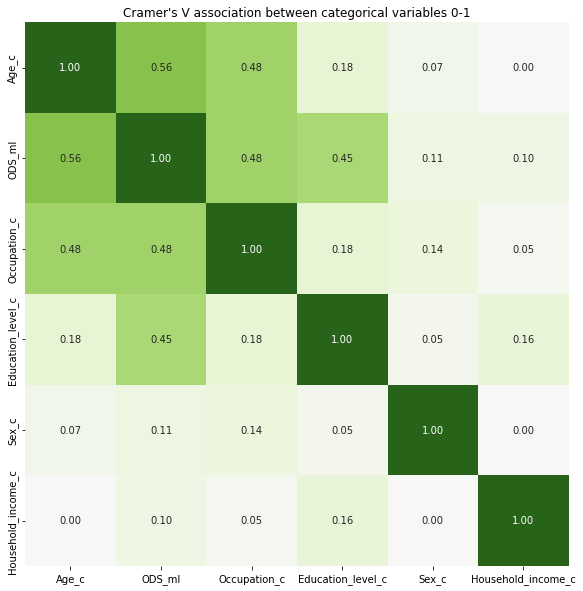

{'corr':                        Age_c    ODS_ml  Occupation_c  Education_level_c  \
 Age_c               1.000000  0.563475      0.484122           0.178169   
 ODS_ml              0.563475  1.000000      0.479024           0.446460   
 Occupation_c        0.484122  0.479024      1.000000           0.175283   
 Education_level_c   0.178169  0.446460      0.175283           1.000000   
 Sex_c               0.068010  0.113208      0.137646           0.047495   
 Household_income_c  0.000000  0.101430      0.046378           0.161561   
 
                        Sex_c  Household_income_c  
 Age_c               0.068010            0.000000  
 ODS_ml              0.113208            0.101430  
 Occupation_c        0.137646            0.046378  
 Education_level_c   0.047495            0.161561  
 Sex_c               1.000000            0.000000  
 Household_income_c  0.000000            1.000000  ,
 'ax': <AxesSubplot:title={'center':"Cramer's V association between categorical variables 0-1

In [108]:
associations(df_3, nominal_columns='auto', numerical_columns=None, mark_columns=False, nom_nom_assoc='cramer', num_num_assoc='pearson',  nan_strategy='replace', nan_replace_value=99, ax=None, figsize=(10,10), annot=True, fmt='.2f', cmap="PiYG", sv_color='silver', cbar=False, vmax=1.0, vmin=None, plot=True, compute_only=False, clustering=True, title="Cramer's V association between categorical variables 0-1", filename=None)

## Theil's U: 
We want to know if there's a certain feature that maximizes the information about our Digital skill index. For this, we will use Theil's U, also known as the Uncertainty Coefficient.This coefficient provides a value in the range of [0,1], where 0 means that feature y provides no information about feature x, and 1 means that feature y provides full information about features x's value.

In [109]:
def conditional_entropy(x,y):
    # entropy of x given y
    y_counter = Counter(y)
    xy_counter = Counter(list(zip(x,y)))
    total_occurrences = sum(y_counter.values())
    entropy = 0
    for xy in xy_counter.keys():
        p_xy = xy_counter[xy] / total_occurrences
        p_y = y_counter[xy[1]] / total_occurrences
        entropy += p_xy * math.log(p_y/p_xy)
    return entropy

def theil_u(x,y):
    s_xy = conditional_entropy(x,y)
    x_counter = Counter(x)
    total_occurrences = sum(x_counter.values())
    p_x = list(map(lambda n: n/total_occurrences, x_counter.values()))
    s_x = ss.entropy(p_x)
    if s_x == 0:
        return 1
    else:
        return (s_x - s_xy) / s_x
    
    
#Theil's U, also known as the Uncertainty Coefficient. 
#Formaly marked as U(x|y), this coefficient provides a value in the range of [0,1],
#where 0 means that feature y provides no information about feature x, and 1 means that feature y provides full information about features x's value

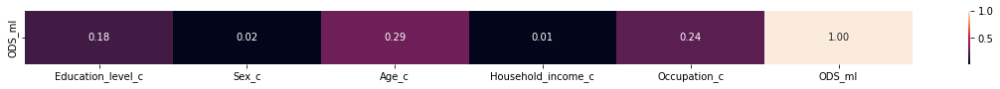

In [110]:
import scipy.stats as ss


theilu = pd.DataFrame(index=['ODS_ml'],columns=df_3.columns)
columns = df_3.columns
for j in range(0,len(columns)):
    u = theil_u(df_3['ODS_ml'].tolist(),df_3[columns[j]].tolist())
    theilu.loc[:,columns[j]] = u
theilu.fillna(value=np.nan,inplace=True)
plt.figure(figsize=(20,1))
sns.heatmap(theilu,annot=True,fmt='.2f')
plt.show()

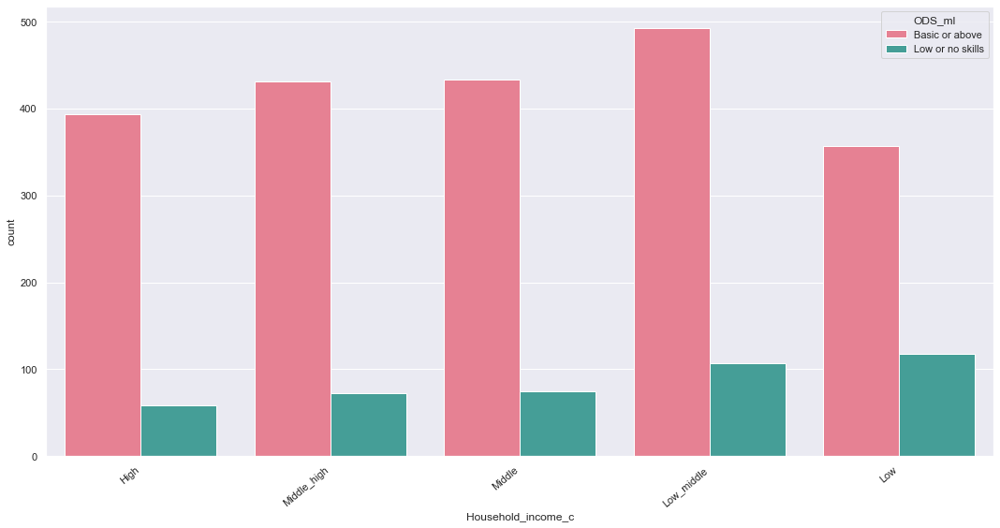

In [90]:
sns.set(rc={'figure.figsize':(15,8)})
order = pd.crosstab(df_3.Household_income_c, df_3.ODS_ml).sort_values('Low or no skills', ascending=True).index

ax=sns.countplot(x='Household_income_c',hue='ODS_ml',data=df_2, order=order,palette="husl")
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")


plt.tight_layout()
plt.show()

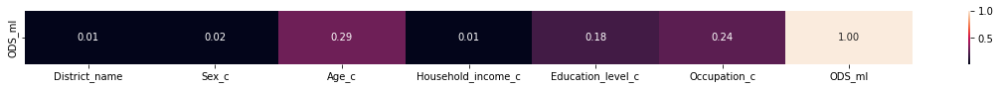

In [112]:
theilu = pd.DataFrame(index=['ODS_ml'],columns=df_4.columns)
columns = df_4.columns
for j in range(0,len(columns)):
    u = theil_u(df_4['ODS_ml'].tolist(),df_4[columns[j]].tolist())
    theilu.loc[:,columns[j]] = u
theilu.fillna(value=np.nan,inplace=True)
plt.figure(figsize=(20,1))
sns.heatmap(theilu,annot=True,fmt='.2f')
plt.show()


In [122]:
# Age, Educational level and ocupation are asssociated to Overall Digital skill, however is not a strong link as coeficients are very low 

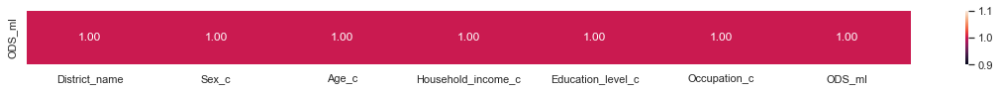

In [123]:
low = df_4[df_3['ODS_ml'].isin(['Low'])]
for j in range(0,len(columns)):
    u = theil_u(low['ODS_ml'].tolist(),low[columns[j]].tolist())
    theilu.loc[:,columns[j]] = u
theilu.fillna(value=np.nan,inplace=True)
plt.figure(figsize=(20,1))
sns.heatmap(theilu,annot=True,fmt='.2f')
plt.show()

In [124]:
#However low skill are perfectly associated with all out sociodemographic variables. This is, all our socidemographic variables determine who belongs to the small minority without digital skills

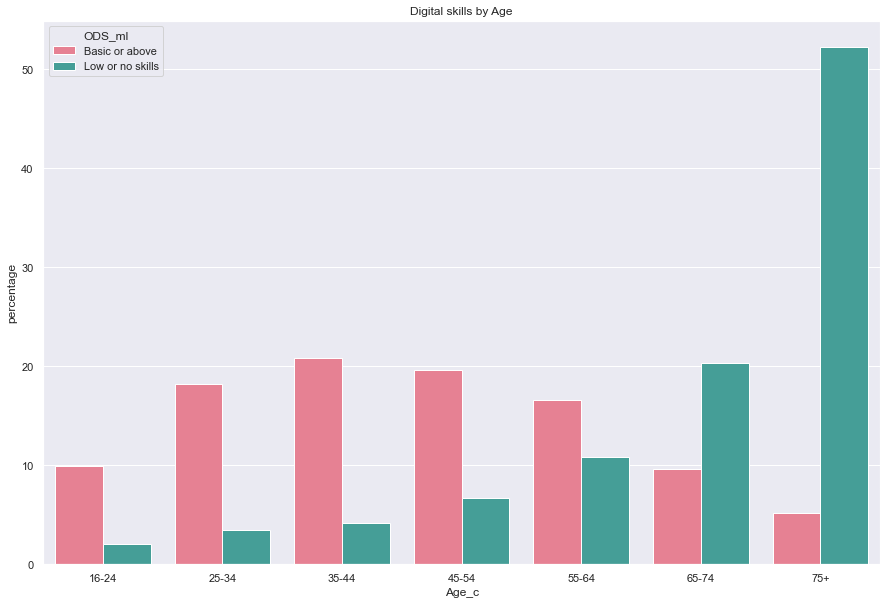

In [115]:
age_counts = (df_3.groupby(['ODS_ml'])['Age_c'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('ODS_ml'))
order = pd.crosstab(df_3.Age_c, df_3.ODS_ml).sort_values('Low or no skills', ascending=True).index
p = sns.barplot(x="Age_c", y="percentage", hue="ODS_ml", data=age_counts, order=order,palette="husl")
_ = plt.setp(p.get_xticklabels(), rotation=0)  # Rotate labels
title =plt.title("Digital skills by Age")
sns.set(rc={'figure.figsize':(15,10)})



In [116]:
new_df = df_2.groupby("Household_income_c")["ODS_ml"].value_counts(normalize=True).round(3)*100
new_df = new_df.rename('Percent').reset_index()
new_df



,Household_income_c,ODS_ml,Percent
0,High,Basic or above,87.0
1,High,Low or no skills,13.0
2,Low,Basic or above,75.2
3,Low,Low or no skills,24.8
4,Low_middle,Basic or above,82.2
5,Low_middle,Low or no skills,17.8
6,Middle,Basic or above,85.2
7,Middle,Low or no skills,14.8
8,Middle_high,Basic or above,85.5
9,Middle_high,Low or no skills,14.5


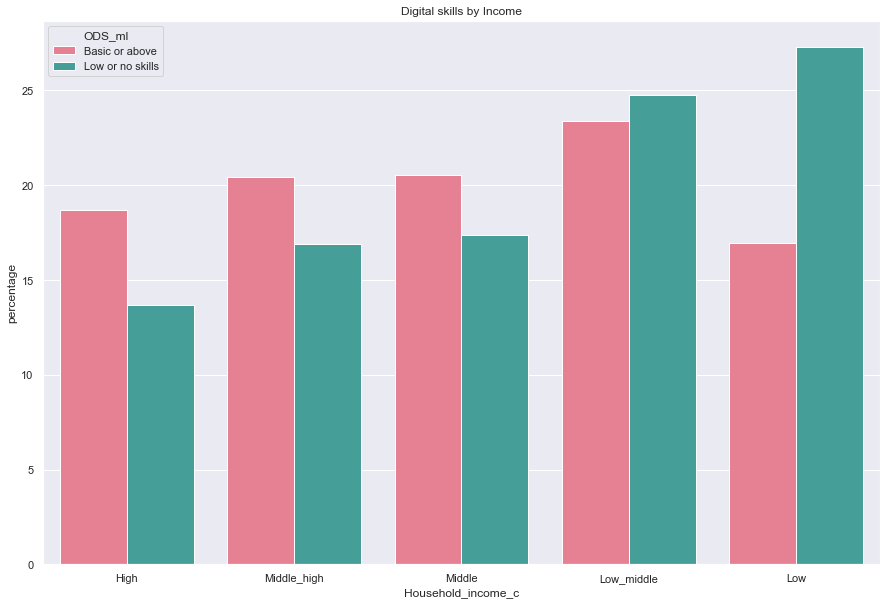

In [117]:
income_counts = (df_3.groupby(['ODS_ml'])['Household_income_c'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('ODS_ml'))
order = pd.crosstab(df_3.Household_income_c, df_3.ODS_ml).sort_values('Low or no skills', ascending=True).index
p = sns.barplot(x="Household_income_c", y="percentage", hue="ODS_ml", data=income_counts, order=order,palette="husl")
_ = plt.setp(p.get_xticklabels(), rotation=0)  # Rotate labels
title =plt.title("Digital skills by Income")

In [118]:
import matplotlib.pyplot as plt
from statsmodels.graphics.mosaicplot import mosaic
from itertools import product
#from matplotlib import rcParams
#rcParams['font.family'] = 'monospace'
#rcParams['font.sans-serif'] = ['Verdana']
import matplotlib.pyplot as plt
props = lambda key: {'color': 'salmon' if 'Women' in key else 'lightgrey'}


Text(0.5, 1.0, 'Digital skills by Gender')

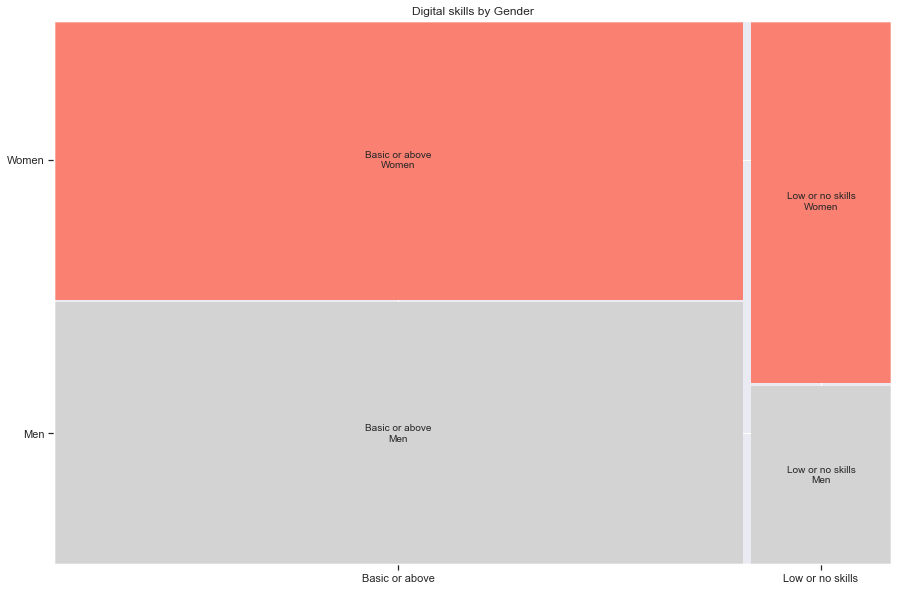

In [119]:
mosaic(df_2, ['ODS_ml', 'Sex_c'],properties=props, gap=0.01)
plt.title("Digital skills by Gender")

## Let's see what is the geographical distribution of our variables and its relation to District variable

In [126]:
# assign data of lists.  
data = {'District_name': ["Ciutat Vella","Eixample","Gràcia","Horta-Guinardó","Les Corts","Nou Barris","Sant Andreu","Sant Martí","Sants-Montjuïc","Sarrià-Sant Gervasi"], 'ODS_ml': [2.8,16.6,8.7,8.3,8.0,23.2,6.6,10.4,5.2,10.4]}  
  
# Create DataFrame  
men = pd.DataFrame(data) 
  
# assign data of lists.  
data1 = {'District_name': ["Ciutat Vella","Eixample","Gràcia","Horta-Guinardó","Les Corts","Nou Barris","Sant Andreu","Sant Martí","Sants-Montjuïc","Sarrià-Sant Gervasi"], 'ODS_ml': [7.7,21.7,4.9,5.6,6.3,22.4,10.5,9.8,4.2,7.0]}  
  
# Create DataFrame  
women = pd.DataFrame(data1)

In [129]:
# We add the link which contains the GeoJson file

BCNGeo = 'https://raw.githubusercontent.com/martgnz/bcn-geodata/master/districtes/districtes.geojson'

# We call folium's library to build a map

BCN_map3 = folium.Map(location=[41.39, 2.17], zoom_start=11) # in location we must add the city's coordinates

# Now we can build our choropleth map by calling the .choropleth method

BCN_map3.choropleth(geo_data=BCNGeo, # GeoJson Coordinates
                   data=women,   # The table which contains the values we are analysing
                   columns=['District_name', 'ODS_ml'],
                   key_on='feature.properties.NOM', # We chose the key we need in the GeoJson file
                   fill_color='YlOrRd',
                   fill_opacity=0.7,
                   line_opacity=0.4,
                   legend_name='Low Digital skills by district WOMEN')


BCN_map3

# We specify a lambda function mapping a GeoJson Feature to a style dict

style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0.1, 
                            'weight': 0.1}

# We specify a function mapping a GeoJson Feature to a style dict for mouse events, in this case "highlighting"

highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}

# We create a new layer for the map which is going to give us the interactivity

BCNT = folium.features.GeoJson(  
    BCNGeo,
    style_function=style_function,
    control=False,
    highlight_function=highlight_function, 
    tooltip=folium.features.GeoJsonTooltip(
        fields=['NOM',],
        aliases=['District name:'],
        style=("background-color: white; color:black; font-family: arial; font-size: 13px; padding: 10px;")
    )
)

BCN_map3.add_child(BCNT) # We add this new layer
BCN_map3.keep_in_front(BCNT) # By keeping it in front we will ensure that each time we deploy the map, this layer will be in the front
folium.LayerControl().add_to(BCN_map3)

BCN_map3

In [130]:

# We add the link which contains the GeoJson file

BCNGeo = 'https://raw.githubusercontent.com/martgnz/bcn-geodata/master/districtes/districtes.geojson'

# We call folium's library to build a map

BCN_map4 = folium.Map(location=[41.39, 2.17], zoom_start=11) # in location we must add the city's coordinates

# Now we can build our choropleth map by calling the .choropleth method

BCN_map4.choropleth(geo_data=BCNGeo, # GeoJson Coordinates
                   data=men,   # The table which contains the values we are analysing
                   columns=['District_name', 'ODS_ml'],
                   key_on='feature.properties.NOM', # We chose the key we need in the GeoJson file
                   fill_color='YlOrRd',
                   fill_opacity=0.7,
                   line_opacity=0.4,
                   legend_name='LOW Digital skills by district MEN')


BCN_map4

# We specify a lambda function mapping a GeoJson Feature to a style dict

style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0.1, 
                            'weight': 0.1}

# We specify a function mapping a GeoJson Feature to a style dict for mouse events, in this case "highlighting"

highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}

# We create a new layer for the map which is going to give us the interactivity

BCNT = folium.features.GeoJson(  
    BCNGeo,
    style_function=style_function,
    control=False,
    highlight_function=highlight_function, 
    tooltip=folium.features.GeoJsonTooltip(
        fields=['NOM',],
        aliases=['District name:'],
        style=("background-color: white; color:black; font-family: arial; font-size: 12px; padding: 10px;")
    )
)

BCN_map4.add_child(BCNT) # We add this new layer
BCN_map4.keep_in_front(BCNT) # By keeping it in front we will ensure that each time we deploy the map, this layer will be in the front
folium.LayerControl().add_to(BCN_map4)

BCN_map4

In [131]:
from IPython.core.display import display, HTML

htmlmapSEX = HTML('<iframe srcdoc="{}" style="float:left; width: {}px; height: {}px; display:inline-block; width: 50%; margin: 0 auto; border: 2px solid black"></iframe>'
           '<iframe srcdoc="{}" style="float:right; width: {}px; height: {}px; display:inline-block; width: 50%; margin: 0 auto; border: 2px solid black"></iframe>'
           .format(BCN_map3.get_root().render().replace('"', '&quot;'),500,500,
                   BCN_map4.get_root().render().replace('"', '&quot;'),500,500))



htmlmapSEX

In [132]:
# assign data of lists.  
data = {'District_name': ["Ciutat Vella","Eixample","Gràcia","Horta-Guinardó","Les Corts","Nou Barris","Sant Andreu","Sant Martí","Sants-Montjuïc","Sarrià-Sant Gervasi"], 'ODS_ml': [40,-15,-20,100,-25,180,63,44,100,-70]}  
  
# Create DataFrame  
income = pd.DataFrame(data)
  
# Print the output.  
income   #This step is used to trick our map to show with diferent colors low and high income areas.

,District_name,ODS_ml
0,Ciutat Vella,40
1,Eixample,-15
2,Gràcia,-20
3,Horta-Guinardó,100
4,Les Corts,-25
5,Nou Barris,180
6,Sant Andreu,63
7,Sant Martí,44
8,Sants-Montjuïc,100
9,Sarrià-Sant Gervasi,-70


In [133]:
# We add the link which contains the GeoJson file

BCNGeo = 'https://raw.githubusercontent.com/martgnz/bcn-geodata/master/districtes/districtes.geojson'

# We call folium's library to build a map

BCN_income = folium.Map(location=[41.39, 2.17], zoom_start=11) # in location we must add the city's coordinates

# Now we can build our choropleth map by calling the .choropleth method

BCN_income.choropleth(geo_data=BCNGeo, # GeoJson Coordinates
                   data=income,   # The table which contains the values we are analysing
                   columns=['District_name', 'ODS_ml'],
                   key_on='feature.properties.NOM', # We chose the key we need in the GeoJson file
                   fill_color='PiYG',
                   fill_opacity=0.7,
                   line_opacity=0.4,
                   legend_name='LOW Digital skills by district')


BCN_income

# We specify a lambda function mapping a GeoJson Feature to a style dict

style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0.1, 
                            'weight': 0.1}

# We specify a function mapping a GeoJson Feature to a style dict for mouse events, in this case "highlighting"

highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}

# We create a new layer for the map which is going to give us the interactivity

BCNT = folium.features.GeoJson(  
    BCNGeo,
    style_function=style_function,
    control=False,
    highlight_function=highlight_function, 
    tooltip=folium.features.GeoJsonTooltip(
        fields=['NOM',],
        aliases=['District name:'],
        style=("background-color: white; color:black; font-family: arial; font-size: 12px; padding: 10px;")
    )
)

BCN_income.add_child(BCNT) # We add this new layer
BCN_income.keep_in_front(BCNT) # By keeping it in front we will ensure that each time we deploy the map, this layer will be in the front
folium.LayerControl().add_to(BCN_income)


BCN_income

In [134]:
df_age = df_2.loc[(df_2["Age_c"] =="75+")&(df_2["ODS_ml"] =="Low or no skills")]
df_age25 = df_2.loc[(df_2["Age_c"] =="25-34")&(df_2["ODS_ml"] =="Low or no skills")]

#AGE75 = df_age.groupby("District_name")["ODS_ml"].apply(lambda x: x.value_counts().head(1)).reset_index()



In [135]:
m = folium.plugins.DualMap(location=(41.39, 2.17), zoom_start=12)


folium.LayerControl(collapsed=False).add_to(m)



# Create a map object of the city of Barcelona
barcelona_map= folium.Map(location=[41.38879, 2.15899], zoom_start=12)


for lat, lng, label in zip(df_age25.Latitud, df_age25.Longitud, df_age25.ODS_ml.astype(str)):
    if label!='0':
        folium.features.CircleMarker(
            [lat, lng],
            radius=3,
            color='black',
            fill=True,
            popup=label,
            fill_color='darkred',
            fill_opacity=0.9
        ).add_to(m.m1)
    
# Create a 2 map object of the city of Barcelona
barcelona_map2= folium.Map(location=[41.38879, 2.15899], zoom_start=12)


for lat, lng, label in zip(df_age.Latitud, df_age.Longitud, df_age.ODS_ml.astype(str)):
    if label!='0':
        folium.features.CircleMarker(
            [lat, lng],
            radius=3,
            color='black',
            fill=True,
            popup=label,
            fill_color='darkred',
            fill_opacity=0.9
        ).add_to(m.m2)
        
    
    
    
    
    
# Show map
m

In [233]:
df_4

,District_name,Sex_c,Age_c,Household_income_c,Education_level_c,Occupation_c,ODS_ml
0,1,Men,55-64,Middle,Batxillerat/Preu/BUP/COU,Unemployed,Basic or above
1,9,Women,55-64,High,Diplomatura/Llicenciatura,Employed,Basic or above
2,3,Women,55-64,Low_middle,Diplomatura/Llicenciatura,Employed,Basic or above
3,1,Women,75+,Middle,Batxillerat/Preu/BUP/COU,Retired/Pensionist,Basic or above
4,0,Men,45-54,Middle,Diplomatura/Llicenciatura,Employed,Basic or above
...,...,...,...,...,...,...,...
2537,6,Women,35-44,Low,Primary/ESO,Unemployed,Low or no skills
2538,6,Women,35-44,Low,Primary/ESO,Unemployed,Low or no skills
2539,6,Men,35-44,Low,FP1/FP,Employed,Basic or above
2540,6,Men,45-54,Low,Primary/ESO,Unemployed,Low or no skills


## CART and C4.5 algorithm with chefboost

In [ ]:
#!pip install chefboost


In [136]:
from chefboost import Chefboost as chef
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier

In [280]:
df_4

,District_name,Sex_c,Age_c,Household_income_c,Education_level_c,Occupation_c,ODS_ml
0,Eixample,Men,55-64,Middle,Batxillerat/Preu/BUP/COU,Unemployed,Basic or above
1,Sarrià-Sant Gervasi,Women,55-64,High,Diplomatura/Llicenciatura,Employed,Basic or above
2,Horta-Guinardó,Women,55-64,Low_middle,Diplomatura/Llicenciatura,Employed,Basic or above
3,Eixample,Women,75+,Middle,Batxillerat/Preu/BUP/COU,Retired/Pensionist,Basic or above
4,Ciutat Vella,Men,45-54,Middle,Diplomatura/Llicenciatura,Employed,Basic or above
...,...,...,...,...,...,...,...
2537,Sant Andreu,Women,35-44,Low,Primary/ESO,Unemployed,Low or no skills
2538,Sant Andreu,Women,35-44,Low,Primary/ESO,Unemployed,Low or no skills
2539,Sant Andreu,Men,35-44,Low,FP1/FP,Employed,Basic or above
2540,Sant Andreu,Men,45-54,Low,Primary/ESO,Unemployed,Low or no skills


# ID3 with district

In [281]:
X = df_4
X = X.rename(columns={"ODS_ml": "Decision"})

In [282]:
X_train, X_test = train_test_split(X, test_size=0.33, random_state=42, stratify=X["Decision"])

In [283]:
config = {'algorithm': 'ID3'}
modelid3 = chef.fit(X_train, config = config)

[INFO]:  4 CPU cores will be allocated in parallel running
ID3  tree is going to be built...
-------------------------
finished in  88.13694095611572  seconds
-------------------------
Evaluate  train set
-------------------------
Accuracy:  94.59141681363903 % on  1701  instances
Labels:  ['Basic or above' 'Low or no skills']
Confusion matrix:  [[1370, 50], [42, 239]]
Precision:  96.4789 %, Recall:  97.0255 %, F1:  96.7514 %


In [284]:
evaluation = chef.evaluate(modelid3, X_test, task="test")

-------------------------
Evaluate  test set
-------------------------
Accuracy:  85.45887961859357 % on  839  instances
Labels:  ['Basic or above' 'Low or no skills']
Confusion matrix:  [[632, 58], [64, 85]]
Precision:  91.5942 %, Recall:  90.8046 %, F1:  91.1977 %


Decision rule:  outputs/rules/rules.py


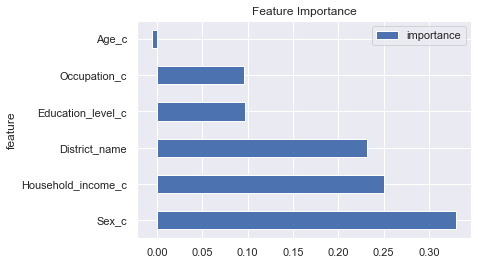

In [285]:
rules1 = "outputs/rules/rules.py"
fi = chef.feature_importance(rules1).set_index("feature")
fi.plot(kind="barh", title="Feature Importance");

# CART

In [286]:
configcart = {'algorithm': 'CART'}
modelcart = chef.fit(X_train, config = configcart)

[INFO]:  4 CPU cores will be allocated in parallel running
CART  tree is going to be built...
-------------------------
finished in  85.39824795722961  seconds
-------------------------
Evaluate  train set
-------------------------
Accuracy:  94.59141681363903 % on  1701  instances
Labels:  ['Basic or above' 'Low or no skills']
Confusion matrix:  [[1370, 50], [42, 239]]
Precision:  96.4789 %, Recall:  97.0255 %, F1:  96.7514 %


In [287]:
evaluation = chef.evaluate(modelcart, X_test, task="test")

['District_name', 'Sex_c', 'Age_c', 'Household_income_c', 'Education_level_c', 'Occupation_c', 'Prediction', 'Decision']
-------------------------
Evaluate  test set
-------------------------
Accuracy:  85.81644815256257 % on  839  instances
Labels:  ['Basic or above' 'Low or no skills']
Confusion matrix:  [[636, 59], [60, 84]]
Precision:  91.5108 %, Recall:  91.3793 %, F1:  91.445 %


Decision rule:  outputs/rules/rules.py


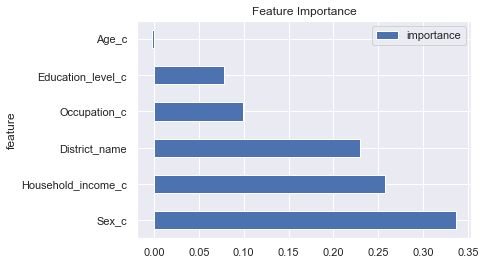

In [288]:
rules1 = "outputs/rules/rules.py"
fi = chef.feature_importance(rules1).set_index("feature")
fi.plot(kind="barh", title="Feature Importance");

# C4.5

In [289]:
configc45 = {'algorithm': 'C4.5'}
modelc45 = chef.fit(X_train, config = configc45)

[INFO]:  4 CPU cores will be allocated in parallel running
C4.5  tree is going to be built...
-------------------------
finished in  75.11022281646729  seconds
-------------------------
Evaluate  train set
-------------------------
Accuracy:  94.59141681363903 % on  1701  instances
Labels:  ['Basic or above' 'Low or no skills']
Confusion matrix:  [[1370, 50], [42, 239]]
Precision:  96.4789 %, Recall:  97.0255 %, F1:  96.7514 %


In [290]:
evaluation = chef.evaluate(modelc45, X_test, task="test")

['District_name', 'Sex_c', 'Age_c', 'Household_income_c', 'Education_level_c', 'Occupation_c', 'Prediction', 'Decision']
-------------------------
Evaluate  test set
-------------------------
Accuracy:  84.86293206197854 % on  839  instances
Labels:  ['Basic or above' 'Low or no skills']
Confusion matrix:  [[629, 60], [67, 83]]
Precision:  91.2917 %, Recall:  90.3736 %, F1:  90.8303 %


Decision rule:  outputs/rules/rules.py


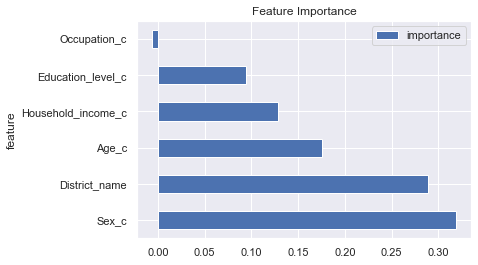

In [291]:
rules1 = "outputs/rules/rules.py"
fi = chef.feature_importance(rules1).set_index("feature")
fi.plot(kind="barh", title="Feature Importance");

# Without district

In [298]:
X = df_5
X = X.rename(columns={"ODS_ml": "Decision"})

In [300]:
X_train, X_test = train_test_split(X, test_size=0.33, random_state=42, stratify=X["Decision"])


In [301]:
config = {'algorithm': 'ID3'}
modelid3 = chef.fit(X_train, config = config)

[INFO]:  4 CPU cores will be allocated in parallel running
ID3  tree is going to be built...
-------------------------
finished in  60.98523497581482  seconds
-------------------------
Evaluate  train set
-------------------------
Accuracy:  92.53380364491476 % on  1701  instances
Labels:  ['Basic or above' 'Low or no skills']
Confusion matrix:  [[1357, 72], [55, 217]]
Precision:  94.9615 %, Recall:  96.1048 %, F1:  95.5297 %


In [302]:
prediction1 = chef.predict(modelid3, X_test.iloc[0])
prediction1

'Basic or above'

In [303]:
X_test.iloc[0]

Education_level_c     Diplomatura/Llicenciatura
Sex_c                                     Women
Age_c                                     25-34
Household_income_c                       Middle
Occupation_c                           Employed
Decision                         Basic or above
Name: 1793, dtype: object

In [304]:
evaluation = chef.evaluate(modelid3, X_test, task="test")


-------------------------
Evaluate  test set
-------------------------
Accuracy:  84.86293206197854 % on  839  instances
Labels:  ['Basic or above' 'Low or no skills']
Confusion matrix:  [[632, 63], [64, 80]]
Precision:  90.9353 %, Recall:  90.8046 %, F1:  90.8699 %


Decision rule:  outputs/rules/rules.py


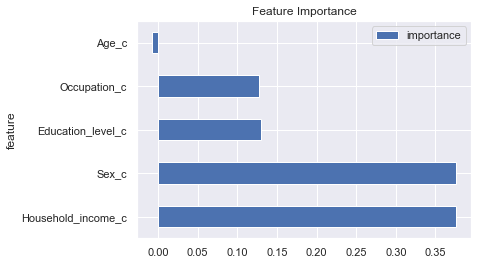

In [305]:
rules1 = "outputs/rules/rules.py"
fi = chef.feature_importance(rules1).set_index("feature")
fi.plot(kind="barh", title="Feature Importance");

# cart

In [306]:
configcart = {'algorithm': 'CART'}
modelcart = chef.fit(X_train, config = configcart)

[INFO]:  4 CPU cores will be allocated in parallel running
CART  tree is going to be built...
-------------------------
finished in  64.01310205459595  seconds
-------------------------
Evaluate  train set
-------------------------
Accuracy:  92.53380364491476 % on  1701  instances
Labels:  ['Basic or above' 'Low or no skills']
Confusion matrix:  [[1357, 72], [55, 217]]
Precision:  94.9615 %, Recall:  96.1048 %, F1:  95.5297 %


In [307]:
evaluationcart = chef.evaluate(modelcart, X_test, task="test")



['Education_level_c', 'Sex_c', 'Age_c', 'Household_income_c', 'Occupation_c', 'Prediction', 'Decision']
-------------------------
Evaluate  test set
-------------------------
Accuracy:  84.86293206197854 % on  839  instances
Labels:  ['Basic or above' 'Low or no skills']
Confusion matrix:  [[632, 63], [64, 80]]
Precision:  90.9353 %, Recall:  90.8046 %, F1:  90.8699 %


Decision rule:  outputs/rules/rules.py


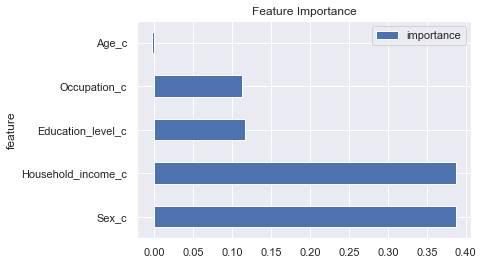

In [308]:
rules1 = "outputs/rules/rules.py"
fi = chef.feature_importance(rules1).set_index("feature")
fi.plot(kind="barh", title="Feature Importance");

# C.4

In [309]:
configC4 = {'algorithm': 'C4.5'}
modelC4 = chef.fit(X_train, config = configC4)

[INFO]:  4 CPU cores will be allocated in parallel running
C4.5  tree is going to be built...
-------------------------
finished in  49.452268838882446  seconds
-------------------------
Evaluate  train set
-------------------------
Accuracy:  92.53380364491476 % on  1701  instances
Labels:  ['Basic or above' 'Low or no skills']
Confusion matrix:  [[1357, 72], [55, 217]]
Precision:  94.9615 %, Recall:  96.1048 %, F1:  95.5297 %


In [310]:
evaluationC4 = chef.evaluate(modelC4, X_test, task="test")

['Education_level_c', 'Sex_c', 'Age_c', 'Household_income_c', 'Occupation_c', 'Prediction', 'Decision']
-------------------------
Evaluate  test set
-------------------------
Accuracy:  84.50536352800954 % on  839  instances
Labels:  ['Basic or above' 'Low or no skills']
Confusion matrix:  [[628, 62], [68, 81]]
Precision:  91.0145 %, Recall:  90.2299 %, F1:  90.6205 %


Decision rule:  outputs/rules/rules.py


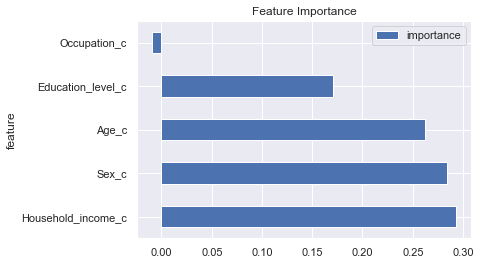

In [311]:
rules = "outputs/rules/rules.py"
fi = chef.feature_importance(rules).set_index("feature")
fi.plot(kind="barh", title="Feature Importance");

In [315]:
predictionC4 = chef.predict(modelC4, X_test.iloc[65])
predictionC4


'Basic or above'

In [316]:
X_test.iloc[65]

Education_level_c     Diplomatura/Llicenciatura
Sex_c                                       Men
Age_c                                     55-64
Household_income_c                   Low_middle
Occupation_c                           Employed
Decision                         Basic or above
Prediction                       Basic or above
Name: 598, dtype: object

In [317]:
predictionC4_2 = chef.predict(modelC4, X_test.iloc[123])
predictionC4_2

'Basic or above'

In [318]:
X_test.iloc[123]

Education_level_c     Diplomatura/Llicenciatura
Sex_c                                       Men
Age_c                                     25-34
Household_income_c                         High
Occupation_c                           Employed
Decision                         Basic or above
Prediction                       Basic or above
Name: 723, dtype: object

In [319]:
X_test.loc[X_test['Sex_c'] =="Women"]


,Education_level_c,Sex_c,Age_c,Household_income_c,Occupation_c,Decision,Prediction
1793,Diplomatura/Llicenciatura,Women,25-34,Middle,Employed,Basic or above,Basic or above
1571,Primary/ESO,Women,75+,Low_middle,Retired/Pensionist,Low or no skills,Low or no skills
592,FP1/FP,Women,75+,High,Retired/Pensionist,Low or no skills,Basic or above
1008,Diplomatura/Llicenciatura,Women,65-74,High,Retired/Pensionist,Basic or above,Basic or above
619,Batxillerat/Preu/BUP/COU,Women,25-34,Middle,Employed,Low or no skills,Basic or above
...,...,...,...,...,...,...,...
48,Batxillerat/Preu/BUP/COU,Women,55-64,Middle,Retired/Pensionist,Basic or above,Basic or above
79,Primary/ESO,Women,75+,Low_middle,Retired/Pensionist,Low or no skills,Low or no skills
946,FP1/FP,Women,55-64,Low_middle,Informal work,Basic or above,Low or no skills
1986,Diplomatura/Llicenciatura,Women,25-34,Middle_high,Unemployed,Basic or above,Basic or above


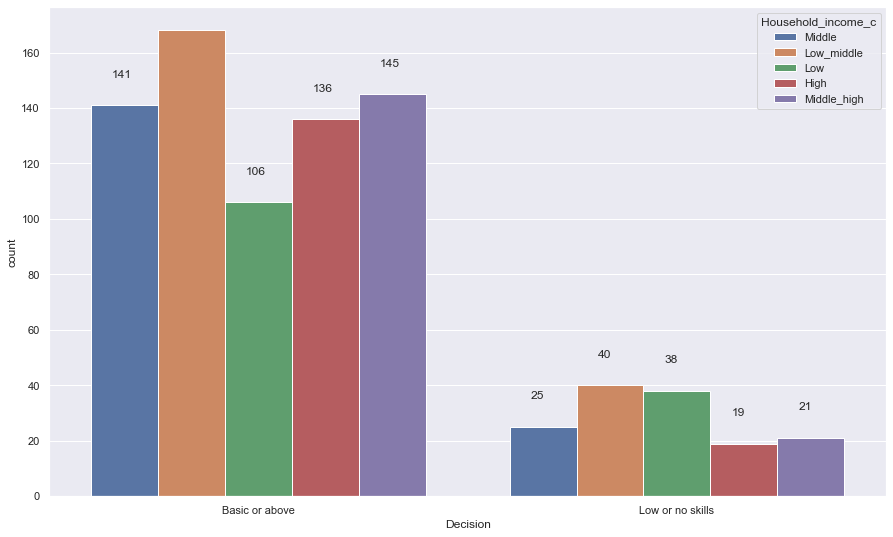

In [320]:
sns.set(rc={'figure.figsize':(15,9)})
ax=sns.countplot(x='Decision',hue='Household_income_c',data=X_test)
for p in ax.patches:
    patch_height = p.get_height()
    if np.isnan(patch_height):
        patch_height = 0
    ax.annotate('{}'.format(int(patch_height)), (p.get_x()+0.05, patch_height+10))
plt.show()

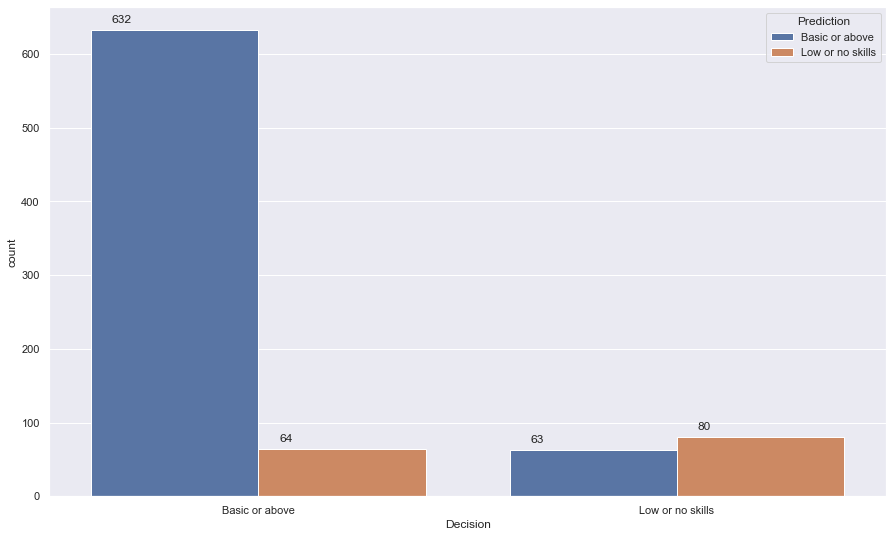

In [323]:
sns.set(rc={'figure.figsize':(15,9)})
ax=sns.countplot(x='Decision',hue='Prediction',data=X_test)
for p in ax.patches:
    patch_height = p.get_height()
    if np.isnan(patch_height):
        patch_height = 0
    ax.annotate('{}'.format(int(patch_height)), (p.get_x()+0.05, patch_height+10))
plt.show()

In [326]:
df_5

,Education_level_c,Sex_c,Age_c,Household_income_c,Occupation_c,ODS_ml
0,Batxillerat/Preu/BUP/COU,Men,55-64,Middle,Unemployed,Basic or above
1,Diplomatura/Llicenciatura,Women,55-64,High,Employed,Basic or above
2,Diplomatura/Llicenciatura,Women,55-64,Low_middle,Employed,Basic or above
3,Batxillerat/Preu/BUP/COU,Women,75+,Middle,Retired/Pensionist,Basic or above
4,Diplomatura/Llicenciatura,Men,45-54,Middle,Employed,Basic or above
...,...,...,...,...,...,...
2537,Primary/ESO,Women,35-44,Low,Unemployed,Low or no skills
2538,Primary/ESO,Women,35-44,Low,Unemployed,Low or no skills
2539,FP1/FP,Men,35-44,Low,Employed,Basic or above
2540,Primary/ESO,Men,45-54,Low,Unemployed,Low or no skills


# pd.factorized sklearn tree

In [363]:
df_7 = df_4.apply(lambda x: pd.factorize(x)[0])


In [364]:

X = df_7.drop(['ODS_ml'],axis=1)
y = df_7['ODS_ml'].tolist()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)



In [365]:
# instantiate the DecisionTreeClassifier model

clf_dt = DecisionTreeClassifier(class_weight='balanced',max_depth = 3,random_state = 42)

# fit the model
clf_dt.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', max_depth=3, random_state=42)

In [366]:
y_pred_dt = clf_dt.predict(X_test)
y_pred_dt[:20]

array([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1])

In [367]:
y_pred_train_dt = clf_dt.predict(X_train)

y_pred_train_dt

array([0, 0, 0, ..., 1, 1, 0])

In [368]:
# Execute this line (of course, modifying the path)
import sys
sys.path.insert(0, '/Users/hayre/Desktop/Ana Data Science/_functions_')

from fx_MLClassification import *

In [369]:
dt_raw = C_Allmetrics(clf_dt, X_train, y_train, X_test, y_test)

-----------------------------------------
TRAIN results
-----------------------------------------
Confusion Matrix 
 [[903 162]
 [ 54 151]]
-----------------------------------------
TEST results
-----------------------------------------
Confusion Matrix 
 [[861 182]
 [ 48 179]]
 Classification report 
    precision    recall  f1-score  support
0   0.947195  0.825503  0.882172   1043.0
1   0.495845  0.788546  0.608844    227.0

++++++++ CLASSIFICATION: Summary of the Metrics +++++++++++++++++++++++++++++++++++
       Accuracy  Precision    Recall        f1
Train  0.795276    0.69001  0.777508  0.704872
test   0.818898    0.72152  0.807025  0.745508


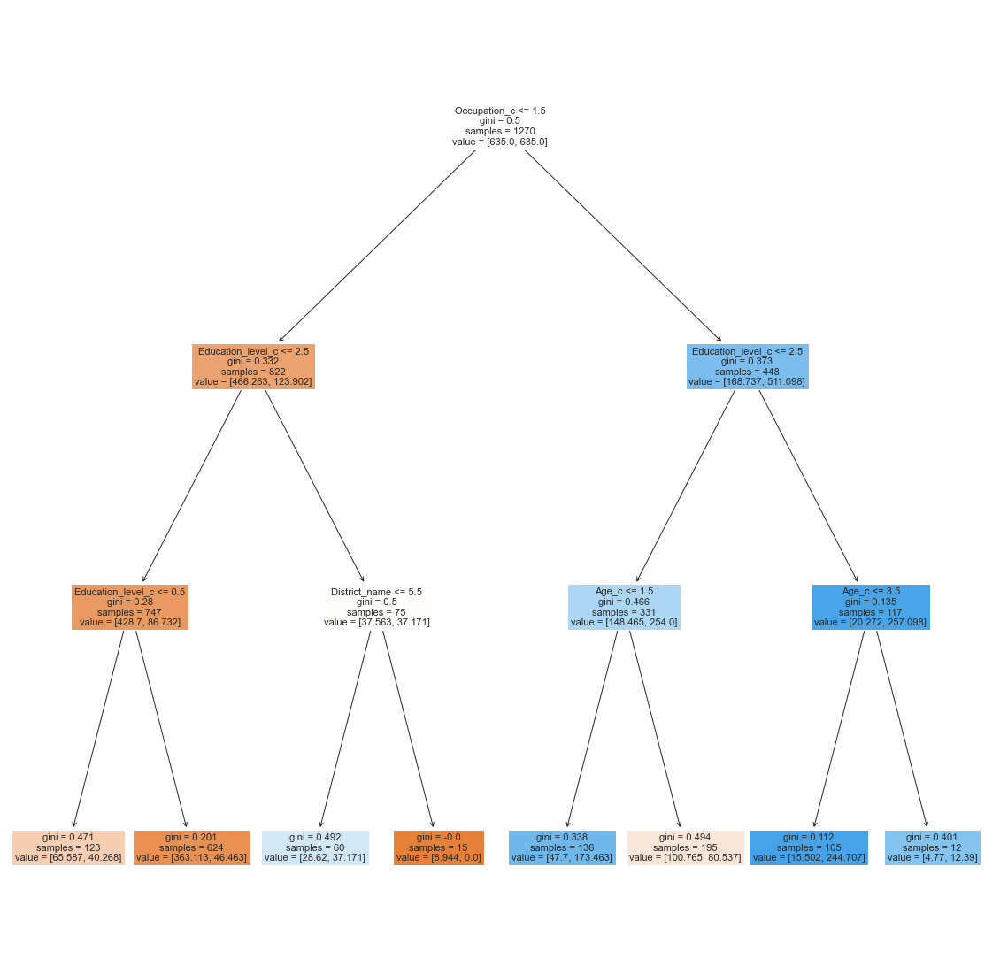

In [370]:
fig = plt.figure(figsize=(20,20))

from sklearn import tree

tree.plot_tree(clf_dt, feature_names = X_train.columns, 
             filled=True);

In [371]:
para_grid = {'splitter': ['best', 'random'],
    'min_samples_split' : range(10,500,20), 
    'max_depth': range(1,18,2)}

print(para_grid)

{'splitter': ['best', 'random'], 'min_samples_split': range(10, 500, 20), 'max_depth': range(1, 18, 2)}


In [372]:
clf_tree = DecisionTreeClassifier(class_weight='balanced',random_state=42)

In [373]:
clf = GridSearchCV(clf_tree,
                   para_grid,
                   scoring='f1',
                   cv=5,
                   n_jobs=-1)

clf.fit(X_train,y_train)

GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': range(1, 18, 2),
                         'min_samples_split': range(10, 500, 20),
                         'splitter': ['best', 'random']},
             scoring='f1')

In [374]:
best_parameters = clf.best_params_

print('The best parameters that fit your data are:\n', best_parameters)

The best parameters that fit your data are:
 {'max_depth': 3, 'min_samples_split': 10, 'splitter': 'best'}


In [375]:
dtree = DecisionTreeClassifier(max_depth= 3, min_samples_split= 10, 
                               splitter= 'best')

dtree.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=3, min_samples_split=10)

In [376]:
dt_opt = C_Allmetrics(dtree, X_train, y_train, X_test, y_test)

-----------------------------------------
TRAIN results
-----------------------------------------
Confusion Matrix 
 [[1039   26]
 [ 126   79]]
-----------------------------------------
TEST results
-----------------------------------------
Confusion Matrix 
 [[1013   30]
 [ 132   95]]
 Classification report 
    precision    recall  f1-score  support
0   0.884716  0.971237  0.925960   1043.0
1   0.760000  0.418502  0.539773    227.0

++++++++ CLASSIFICATION: Summary of the Metrics +++++++++++++++++++++++++++++++++++
       Accuracy  Precision    Recall        f1
Train  0.874803   0.804004  0.671149  0.705835
test   0.872441   0.822358  0.694870  0.732866


In [377]:
dt_opt

,Accuracy,Precision,Recall,f1
Train,0.874803,0.804004,0.671149,0.705835
test,0.872441,0.822358,0.694870,0.732866


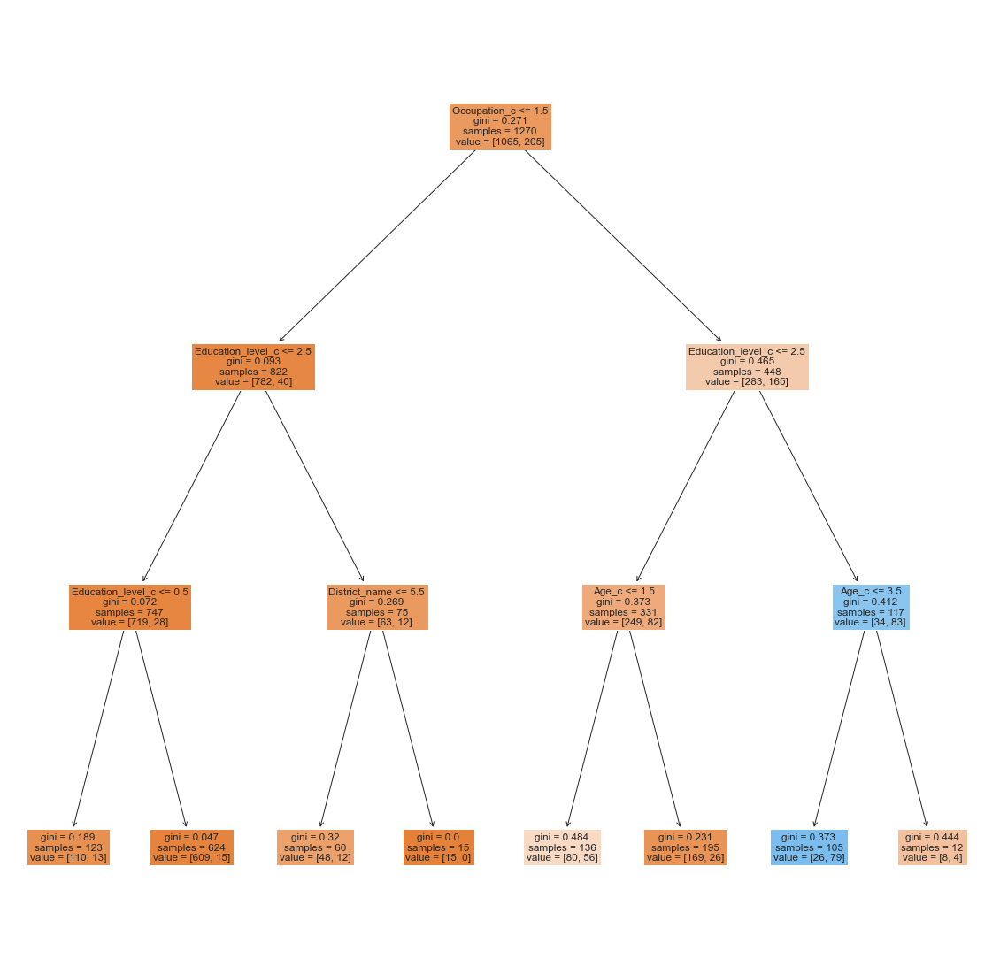

In [378]:
fig = plt.figure(figsize=(20,20))


tree.plot_tree(dtree, feature_names = X_train.columns, 
             filled=True);

# PCA

In [379]:
from sklearn.decomposition import PCA

# Instantiate the model
pca = PCA(n_components=3)

# Fit the model with the scaled data
pca.fit(df_7)

PCA(n_components=3)

In [380]:
x_pca = pca.transform(df_7)

In [381]:
x_pca = pd.DataFrame(x_pca, columns = ['PC1', 'PC2', 'PC3'])



In [383]:
pca.explained_variance_ratio_ #first component explains 56 percent of the variance

array([0.56163586, 0.22567205, 0.07909443])

In [384]:
# get the index of the most important feature on EACH component
# LIST COMPREHENSION HERE
# number of components
n_pcs= pca.components_.shape[0]
most_important = [np.abs(pca.components_[i]).argmax() for i in range(n_pcs)]

initial_feature_names = X.columns
# get the names
most_important_names = [initial_feature_names[most_important[i]] for i in range(n_pcs)]

# LIST COMPREHENSION HERE AGAIN
dic = {'PC{}'.format(i): most_important_names[i] for i in range(n_pcs)}

# build the dataframe
df_importantFeatures = pd.DataFrame(dic.items())

In [385]:
df_importantFeatures

,0,1
0,PC0,District_name
1,PC1,Age_c
2,PC2,Household_income_c


In [386]:
pca_comp=abs(pca.components_)
for pc in pca_comp:
  importantFeatures=zip(X.columns,pc)
  data=list(importantFeatures)
  sorted_by_second = sorted(data, key=lambda tup: tup[1], reverse=True)
  print(sorted_by_second)   

[('District_name', 0.9581832284586189), ('Household_income_c', 0.28338373066981615), ('Age_c', 0.030611794579954825), ('Education_level_c', 0.018583507172084228), ('Occupation_c', 0.01706933845095673), ('Sex_c', 0.0016599238952493267)]
[('Age_c', 0.9948437736572645), ('Education_level_c', 0.07651439620136913), ('District_name', 0.024032503832702123), ('Household_income_c', 0.02192405086741453), ('Sex_c', 0.015757840105696835), ('Occupation_c', 0.006055454450605324)]
[('Household_income_c', 0.9479543606490021), ('District_name', 0.2809753878416493), ('Occupation_c', 0.10834689502585597), ('Education_level_c', 0.09485235453226665), ('Age_c', 0.02399493096868984), ('Sex_c', 0.005976849810802598)]


In [387]:
df_8 = df_7[["District_name","Household_income_c","Age_c","ODS_ml"]]

In [388]:
X = df_8.drop(['ODS_ml'], axis=1)

y = df_8.ODS_ml

In [389]:
# split X and y into training and testing sets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size = 0.33, 
                                                    random_state = 42)

In [390]:
# instantiate the DecisionTreeClassifier model

dt_pca = DecisionTreeClassifier(class_weight="balanced",random_state = 42)

# fit the model
dt_pca.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', random_state=42)

In [391]:
y_pred_dt = dt_pca.predict(X_test)

y_pred_train_dt = dt_pca.predict(X_train)



In [392]:
pca_raw= C_Allmetrics(dt_pca, X_train, y_train, X_test, y_test)

-----------------------------------------
TRAIN results
-----------------------------------------
Confusion Matrix 
 [[1143  272]
 [  55  231]]
-----------------------------------------
TEST results
-----------------------------------------
Confusion Matrix 
 [[557 136]
 [ 30 116]]
 Classification report 
    precision    recall  f1-score  support
0   0.948893  0.803752  0.870313    693.0
1   0.460317  0.794521  0.582915    146.0

++++++++ CLASSIFICATION: Summary of the Metrics +++++++++++++++++++++++++++++++++++
       Accuracy  Precision    Recall        f1
Train  0.786023   0.681168  0.768117  0.699022
test   0.802145   0.704605  0.799136  0.726614


In [393]:
dt_raw

,Accuracy,Precision,Recall,f1
Train,0.795276,0.69001,0.777508,0.704872
test,0.818898,0.72152,0.807025,0.745508


In [394]:
fig = plt.figure(figsize=(150,150))

from sklearn import tree

tree.plot_tree(dt_pca, feature_names = X_train.columns, 
             filled=True);
fig.savefig("decistion_tree.png")

In [395]:
para_grid = {'splitter': ['best', 'random'],
    'min_samples_split' : range(10,500,20), 
    'max_depth': range(1,18,2)}

print(para_grid)

{'splitter': ['best', 'random'], 'min_samples_split': range(10, 500, 20), 'max_depth': range(1, 18, 2)}


In [396]:
clf_pca = DecisionTreeClassifier(class_weight='balanced',random_state=42)

In [397]:
clf = GridSearchCV(clf_pca,
                   para_grid,
                   scoring='f1',
                   cv=5,
                   n_jobs=-1)

clf.fit(X_train,y_train)

GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': range(1, 18, 2),
                         'min_samples_split': range(10, 500, 20),
                         'splitter': ['best', 'random']},
             scoring='f1')

In [398]:
best_parameters = clf.best_params_

print('The best parameters that fit your data are:\n', best_parameters)

The best parameters that fit your data are:
 {'max_depth': 5, 'min_samples_split': 110, 'splitter': 'random'}


In [399]:
dtreepca = DecisionTreeClassifier(class_weight="balanced",max_depth= 5, min_samples_split= 110, 
                               splitter= 'random')

dtreepca.fit(X_train,y_train)

DecisionTreeClassifier(class_weight='balanced', max_depth=5,
                       min_samples_split=110, splitter='random')

In [400]:
dt_pcaa = C_Allmetrics(dtreepca, X_train, y_train, X_test, y_test)

-----------------------------------------
TRAIN results
-----------------------------------------
Confusion Matrix 
 [[916 499]
 [ 50 236]]
-----------------------------------------
TEST results
-----------------------------------------
Confusion Matrix 
 [[420 273]
 [ 23 123]]
 Classification report 
    precision    recall  f1-score  support
0   0.948081  0.606061  0.739437    693.0
1   0.310606  0.842466  0.453875    146.0

++++++++ CLASSIFICATION: Summary of the Metrics +++++++++++++++++++++++++++++++++++
       Accuracy  Precision    Recall        f1
Train  0.773113   0.680652  0.773035  0.692663
test   0.647199   0.629344  0.724263  0.596656


In [401]:
dt_raw

,Accuracy,Precision,Recall,f1
Train,0.795276,0.69001,0.777508,0.704872
test,0.818898,0.72152,0.807025,0.745508


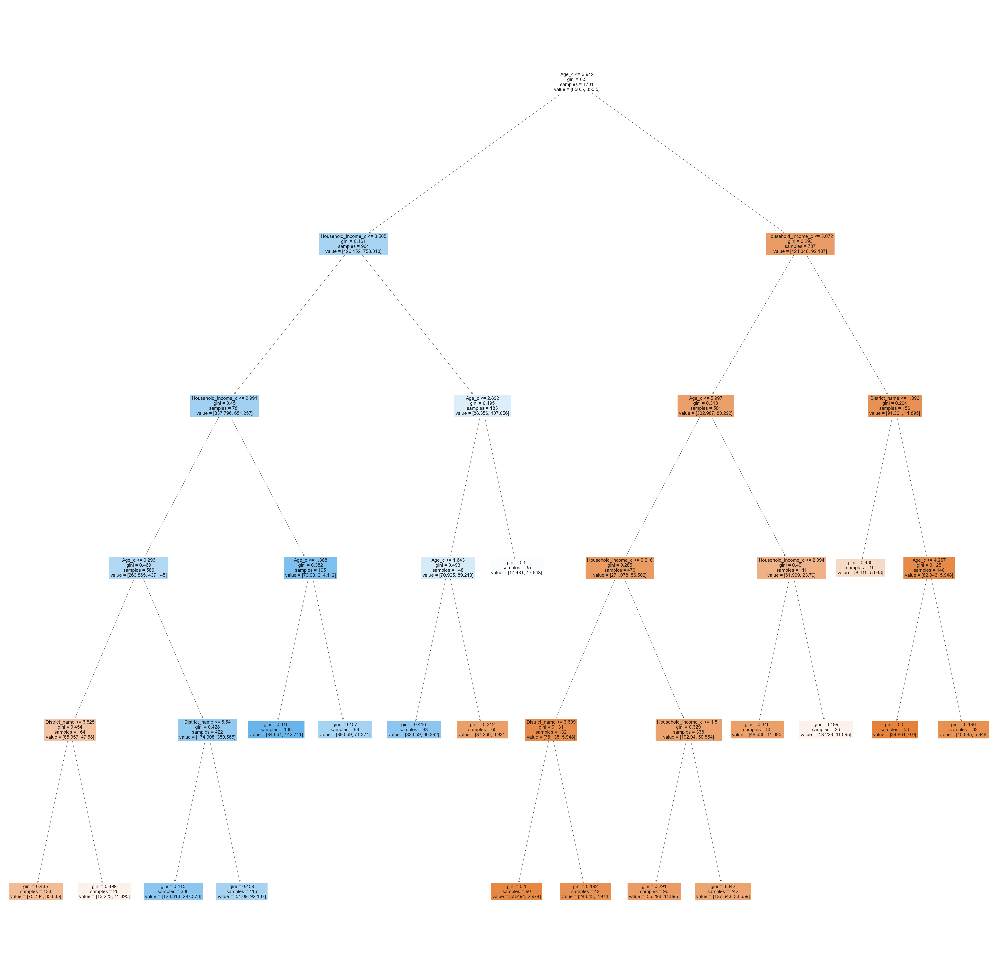

In [402]:
fig = plt.figure(figsize=(100,100))

from sklearn import tree

tree.plot_tree(dtreepca, feature_names = X_train.columns, 
             filled=True);

# Encode with label encoder

In [403]:
from sklearn.preprocessing import LabelEncoder

In [404]:
df_4.columns

Index(['District_name', 'Sex_c', 'Age_c', 'Household_income_c',
       'Education_level_c', 'Occupation_c', 'ODS_ml'],
      dtype='object')

In [405]:
#district_name age nacionality 

SyntaxError: invalid syntax (3679344406.py, line 1)

In [414]:
lb_make = LabelEncoder() 
lb_make

LabelEncoder()

In [423]:
df_4["District_name"] =lb_make.fit_transform(df_4['District_name'])


In [424]:
df_4["Sex_c"] =lb_make.fit_transform(df_4['Sex_c'])

df_4["Age_c"] =lb_make.fit_transform(df_4['Age_c'])
df_4["Household_income_c"] =lb_make.fit_transform(df_4['Household_income_c'])
df_4["Education_level_c"] =lb_make.fit_transform(df_4['Education_level_c'])
df_4["Occupation_c"] =lb_make.fit_transform(df_4['Occupation_c'])
df_4["ODS_ml"] =lb_make.fit_transform(df_4['ODS_ml'])

df_4

,District_name,Sex_c,Age_c,Household_income_c,Education_level_c,Occupation_c,ODS_ml
0,1,0,4,3,0,5,0
1,9,1,4,0,2,1,0
2,3,1,4,2,2,1,0
3,1,1,6,3,0,3,0
4,0,0,3,3,2,1,0
...,...,...,...,...,...,...,...
2537,6,1,2,1,4,5,1
2538,6,1,2,1,4,5,1
2539,6,0,2,1,3,1,0
2540,6,0,3,1,4,5,1


In [425]:
X = df_4.drop(['ODS_ml'], axis=1)

y = df_4['ODS_ml']

In [426]:
# split X and y into training and testing sets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size = 0.33, 
                                                    random_state = 42)

In [427]:
# instantiate the DecisionTreeClassifier model

dt_le = DecisionTreeClassifier(class_weight='balanced',random_state = 42)

# fit the model
dt_le.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', random_state=42)

In [428]:
y_pred_dt = clf_dt.predict(X_test)

In [429]:
y_pred_train_dt = clf_dt.predict(X_train)



In [430]:
Metric_dt_le =C_Allmetrics(dt_le, X_train, y_train, X_test, y_test)

-----------------------------------------
TRAIN results
-----------------------------------------
Confusion Matrix 
 [[1270  145]
 [   4  282]]
-----------------------------------------
TEST results
-----------------------------------------
Confusion Matrix 
 [[589 104]
 [ 46 100]]
 Classification report 
    precision    recall  f1-score  support
0   0.927559  0.849928  0.887048    693.0
1   0.490196  0.684932  0.571429    146.0

++++++++ CLASSIFICATION: Summary of the Metrics +++++++++++++++++++++++++++++++++++
       Accuracy  Precision    Recall        f1
Train  0.812470   0.691997  0.749313  0.710063
test   0.821216   0.708878  0.767430  0.729238


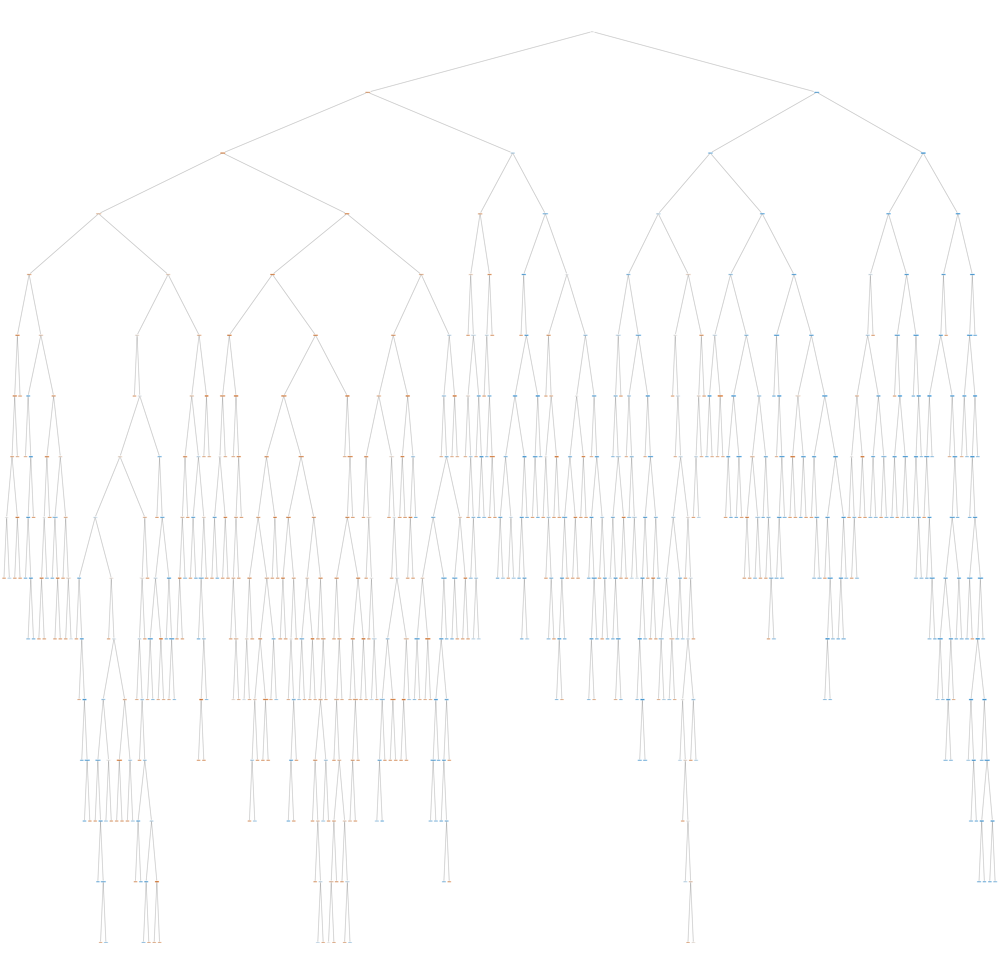

In [431]:
fig = plt.figure(figsize=(100,100))

from sklearn import tree

tree.plot_tree(dt_le, feature_names = X_train.columns, 
             filled=True);

In [432]:
para_grid = {'splitter': ['best', 'random'],
    'min_samples_split' : range(10,500,20), 
    'max_depth': range(1,20,2)}

print(para_grid)

{'splitter': ['best', 'random'], 'min_samples_split': range(10, 500, 20), 'max_depth': range(1, 20, 2)}


In [433]:
clf_t = DecisionTreeClassifier(class_weight='balanced',random_state=42)

In [434]:
clf = GridSearchCV(clf_t,
                   para_grid,
                   scoring='f1',
                   cv=5, #how many folds
                   n_jobs=-1)

clf.fit(X_train,y_train)

GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': range(1, 20, 2),
                         'min_samples_split': range(10, 500, 20),
                         'splitter': ['best', 'random']},
             scoring='f1')

In [435]:
best_parameters = clf.best_params_
clf.best_params_

{'max_depth': 3, 'min_samples_split': 10, 'splitter': 'random'}

In [436]:
DT = DecisionTreeClassifier(class_weight='balanced',max_depth= 3, min_samples_split= 10, 
                               splitter= 'random')

DT.fit(X_train,y_train)

DecisionTreeClassifier(class_weight='balanced', max_depth=3,
                       min_samples_split=10, splitter='random')

In [437]:
dt_opti = C_Allmetrics(DT, X_train, y_train, X_test, y_test)

-----------------------------------------
TRAIN results
-----------------------------------------
Confusion Matrix 
 [[1058  357]
 [  49  237]]
-----------------------------------------
TEST results
-----------------------------------------
Confusion Matrix 
 [[516 177]
 [ 22 124]]
 Classification report 
    precision    recall  f1-score  support
0   0.959108  0.744589  0.838343    693.0
1   0.411960  0.849315  0.554810    146.0

++++++++ CLASSIFICATION: Summary of the Metrics +++++++++++++++++++++++++++++++++++
       Accuracy  Precision    Recall        f1
Train  0.767238   0.681415  0.783627  0.691762
test   0.762813   0.685534  0.796952  0.696576


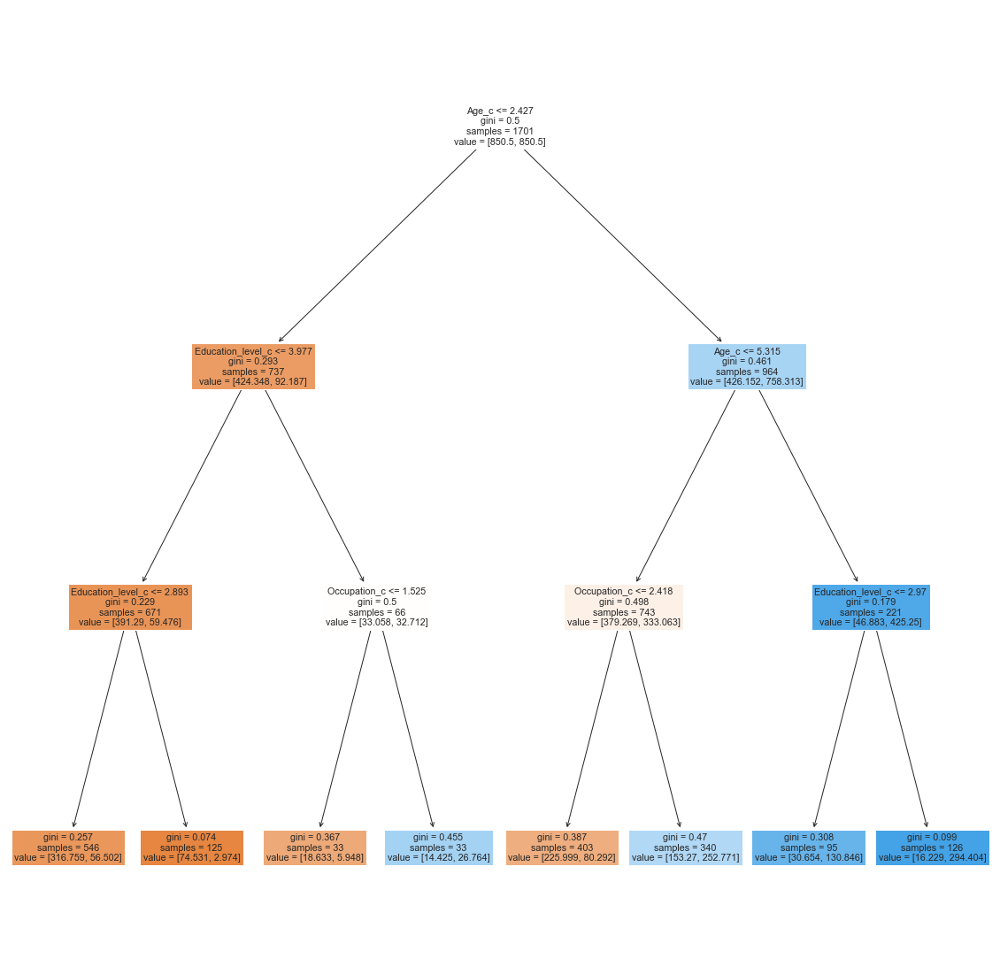

In [438]:
from sklearn import tree
fig = plt.figure(figsize=(20,20))
tree.plot_tree(DT, feature_names = X_train.columns, 
             filled=True);